In [1]:
"""
Explainer:

This code loads in tissue samples intersected on filtered blocks (made after calling bedtools intersect on bedfile of filtered blocks here: /well/ludwig/users/dyp502/code/tissue_atlas_code_2023/segment/filter_blocks_pipeline.py)
We load in these intersections then make atlases by aggregating across regions. We then filter by top_n% variance blocks, and call top_n DMBs.

"""


import pandas as pd
import numpy as np
import os
import collections
import time
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from scipy import optimize
import pickle
# import plotly.express as px
from random import randrange
from tqdm import tqdm
from typing import List
import itertools
from scipy.stats import ttest_ind, ttest_1samp
import warnings
from matplotlib.colors import LogNorm

warnings.filterwarnings('ignore')





def grail_find_markers_copy(tf,args,hypo=True,sort_by_delta_quant=True,t_test=False):
    """
    Adapting the Grail find_markers code to our data, and taking out of the Class it's defined within. 
    Input: MR df, and args: a dictionary containing all the threshold and parameters for DMR finding.
    These thresholds are then used to call DMRs.
    We set tg_quant and bg_quant only once. However we need to use these parameters differently depending
    on whether we're finding hyper or hypo DMRs. The intuition for why we need to rotate these is so we're 
    always finding the delta between max(hypomethylated_group) and min(hypermethylated group).
    
    Example: tg_quant = 0.25, bg_quant = 0.975
    
    If we're finding Hypo DMRs, target group is at bottom, so will calculate delta between:
    A. (1-tg_quant) percentile of target group, ie the 75th percentile of the lowly methylated group (near the top)
    B. bg_quant percentile of background, so 2.5th percentile of highly methylated group (near the bottom)
    
    If we're finding Hyper DMRs, target group near top, so instead calculate delta between:
    A. tg_quant percentile of target group, ie 25th percentile of highly methylated group (near bottom)
    B. (1 - bg_quant) percentile of background, so 97.5th percentile of lowly methylated group (near top)
    
    
    
    Finds Hypo DMRs by default, so assumes tg_quant is the quantile for the unmethylated group 
    
    
    Notes from using this function:
    
    - np.nanquantile interpolates! ie it doesn't select the highest value in a list of 3 if target_quantile = 0.75, 
    it instead interpolates a new value.
    
    - I _think_ the way they use this function is to calculate delta_quants between tg and bg for each tissue, then
    just pick the top n DMRs with largest delta_quant value. I've explicitly specified the polarity for calculating 
    delta_quants, so that the subtraction is different for hypo vs hyper.
    
    - Need to drop NaNs from the input df before passing to this function
   
    """
    
    
    
    tg_names = args['tg_names']
    bg_names = args['bg_names']
    tg_quant = args['tg_quant']
    bg_quant = args['bg_quant']
    unmeth_mean_thresh = args['unmeth_mean_thresh'] # used to filter out regions where tg_mean is greater than this value
    meth_mean_thresh = args['meth_mean_thresh'] # used to filter out regions where bg_mean is less than this value
    delta_means = args['delta_means'] # pick regions with mean_delta > this threshold
    unmeth_quant_thresh = args['unmeth_quant_thresh'] # Target Group quantile (tg) needs to be lower than this
    meth_quant_thresh = args['meth_quant_thresh'] # Background Group quantile (tg) needs to be lower than this
    delta_quants = args['delta_quants'] # threshold delta between values of the two groups quantile, eg if delta_quants = 0.5, then delta between 75th percentile of tg and 2.5th percentile of background needs to be greater than this value

    print(f"tg_names: {tg_names}")
    print(f"bg_names: {bg_names}")
    if hypo:

        target_quantile = 1-tg_quant
        background_quantile = bg_quant
        print(f"Hypo, so target_quantile={target_quantile} and background_quantile={background_quantile}")

    else: # hyper DMRs, so target has high methylation and background has low
        print(f"Hyper, so:")

        target_quantile = tg_quant
        background_quantile = 1-bg_quant
        print(f"Hyper, so target_quantile={target_quantile} and background_quantile={background_quantile}")
        
#     print(f"target_quantile: {target_quantile}")
#     print(f"background_quantile: {background_quantile}")


    tfX = tf.copy()

    # Compute maxmin
    tfX['delta_maxmin'] = np.abs(tfX[args['bg_names']].min(axis=1) - tfX[args['tg_names']].max(axis=1))

    # Compute means for target and background

    with warnings.catch_warnings():
        warnings.simplefilter("ignore", category=RuntimeWarning)
        tfX['tg_mean'] = np.nanmean(tfX[args['tg_names']], axis=1)
        tfX['bg_mean'] = np.nanmean(tfX[args['bg_names']], axis=1)
    #     tfX['delta_means'] = tfX['bg_mean'] - tfX['tg_mean']

    # Change this code to make delta_means always positive for rows containing the target group's DMRs
    if hypo:
        tfX['delta_means'] = tfX['bg_mean'] - tfX['tg_mean']
    else:
        tfX['delta_means'] = tfX['tg_mean'] - tfX['bg_mean']




    print(f"Shape of df before any filtering: {len(tfX)}")
    print(tfX)
    # filter by mean thresholds  - selects rows where tg_mean < threshold and bg_mean > threshold for hypomethylated DMRs
    # set these to 0 and 1 if we don't want to filter out any rows based on tg and ug means
    keep_umt = (tfX['tg_mean'] <= args['unmeth_mean_thresh']) # filters out any regions with tg_mean < unmeth_mean_thresh
    keep_mmt = (tfX['bg_mean'] >= args['meth_mean_thresh']) # filters out any regions with bg_mean < meth_mean_thresh

    ## CHANGE: this has been changed to check absolute value, so works for hyper and hypo DMRs
    keep_delta_mean = (tfX['delta_means'] >= args['delta_means']) # optionally also include regions with > delta mean
    tfX = tfX.loc[keep_umt & keep_mmt & keep_delta_mean, :]#.reset_index(drop=True)
    print(f"Shape of df after delta_means filtering: {len(tfX)}")

    # if tfX.empty:
    #     return tfX

    # Compute quantiles for target and background - this just computes the values of the quantiles we've set - doesn't do any filtering

    tfX['tg_quant'] = np.nanquantile(tfX[args['tg_names']], target_quantile, axis=1) # compute quantile, ignoring NaNs
    tfX['bg_quant'] = np.nanquantile(tfX[args['bg_names']], background_quantile, axis=1)

    if hypo: # we want to keep the directionality of this, to avoid accidentally finding DMRs for other tissues, eg Eosinophil
        tfX['delta_quants'] = tfX['bg_quant'] - tfX['tg_quant']
    else:
        tfX['delta_quants'] = tfX['tg_quant'] - tfX['bg_quant'] 


    # filter by quantile thresholds we've set above. 
    #     if args['repro']:
    #         keep_uqt = (tfX['tg_quant'] < args['unmeth_quant_thresh'])
    #     else:
    if hypo: # hypo DMR, so target group quantile needs to be lower than unmeth_quant_thresh
        keep_uqt = (tfX['tg_quant'] <= unmeth_quant_thresh)
        keep_mqt = (tfX['bg_quant'] >= meth_quant_thresh) 
    else: # hyper DMR, so target group quantile needs to be higher than meth_quant_thresh
        keep_uqt = (tfX['bg_quant'] <= unmeth_quant_thresh)
        keep_mqt = (tfX['tg_quant'] >= meth_quant_thresh) 
    # meth_quant_thresh is threshold MR value for low quantile of methylated group. 
    # So if tg_quant is 0.75, and meth_quant_thresh is 0.8, then we filter out rows where the 75th percentile of the target group is not  want the 
    #     keep_mqt = (tfX['bg_quant'] >= args['meth_quant_thresh']) 

    keep_delta_quants = (tfX['delta_quants'] >= args['delta_quants'])
    tfX = tfX.loc[keep_uqt & keep_mqt & keep_delta_quants, :]#.reset_index(drop=True)
    print(f"Shape of df after delta quants filtering: {len(tfX)}")

    if sort_by_delta_quant:
        tfX = tfX.sort_values(by='delta_quants',ascending=False)#.head(top_n)



    print(len(tfX))
    ## Add values for t-test, but don't filter by significance
    pval=0.05
    bonferroni_alpha = pval / len(tfX)


    if len(tg_names) == 1:
        # Use the single value in tg_names as the population mean
        print(f"Only one tissue sample in tg_group, so using one-sample independent t-test (two-sided) - comparing mean of bg_group to a single value in tg_group. \nNull hypothesis is expected value (mean) of samples is equal to existing population mean")
        popmean = tfX[tg_names].values.flatten()[0]
        r = ttest_1samp(tfX[bg_names], popmean, axis=1, nan_policy='omit')
    elif len(bg_names) == 1:
        # Use the single value in bg_names as the population mean
        print(f"Only one tissue sample in bg_group, so using one-sample independent t-test (two-sided) - comparing mean of tg_group to a single value in bg_group")
        popmean = tfX[bg_names].values.flatten()[0]
        r = ttest_1samp(tfX[tg_names], popmean, axis=1, nan_policy='omit')
    else:
        print(f"Performing two sample independent t-test (two sided). Null hypothesis is two independent samples have identical means. \n Size of tg_group={len(tg_names)} and size of bg_group={len(bg_names)}")
        r = ttest_ind(tfX[tg_names], tfX[bg_names], axis=1, nan_policy='omit')

    tfX['ttest'] = r.pvalue
    tfX['significant_dmrs'] = tfX['ttest'] <= bonferroni_alpha

    
    
    if len(tg_names) == 1:
        # Use the single value in tg_names as the population mean
        popmean = tfX[tg_names].values.flatten()[0]
        r = ttest_1samp(tfX[bg_names], popmean, axis=1, nan_policy='omit')
    elif len(bg_names) == 1:
        # Use the single value in bg_names as the population mean
        popmean = tfX[bg_names].values.flatten()[0]
        r = ttest_1samp(tfX[tg_names], popmean, axis=1, nan_policy='omit')
    else:
        r = ttest_ind(tfX[tg_names], tfX[bg_names], axis=1, nan_policy='omit')

    tfX['ttest'] = r.pvalue
    tfX['significant_dmrs'] = tfX['ttest'] <= bonferroni_alpha



    if t_test:
        pval=0.05
        bonferroni_alpha = pval / len(tfX)
        tfX = dmr_ttest(tfX, tg_names, bg_names, bonferroni_alpha)
        
    return tfX




def get_grail_dmrs(df,
                  top_n,
                  tissue_groups,
                  tissue_id_map,
                  hypo=True,
                  hyper=True,
                  args=None):

    if not args:
        args = {
            'tg_names':'',
            'bg_names':'',
            'na_rate_tg': 0.334,
            'na_rate_bg': 0.334,
            'only_hyper': False,
            'only_hypo': False,
        #     'delta_means': 0.3,
            'delta_means':0.01, # temporarily setting v easy
            'delta_quants': -10,
            'tg_quant': 0.25,
            'bg_quant': 0.025,
            'unmeth_quant_thresh': 1.0,
            'meth_quant_thresh': 0.0,
            'unmeth_mean_thresh': 1.0,
            'meth_mean_thresh': 0.0,
            'pval': 0.05,
            'delta_maxmin': -1,
            'repro':False,
        }


    hypo_dmrs = pd.DataFrame([])
    hyper_dmrs = pd.DataFrame([])

    tissue_samples_in_this_df = list(df.columns)
    # df = tissue_samples_mr[tissue_samples_in_this_df].dropna()
    for tissue in tissue_groups:
    # for tissue in ['Liver']:
        tg_names = [u for u in tissue_id_map[tissue] if u in tissue_samples_in_this_df]
        bg_names = [u for u in tissue_samples_in_this_df if u not in tg_names]

        args['tg_names'] = tg_names
        args['bg_names'] = bg_names
        if hypo:
            tfX = grail_find_markers_copy(df,args,hypo=True)
            tfX['Hyper_or_Hypo'] = 'Hypo'
            tfX['selected_tissue'] = tissue
            hypo_dmrs = pd.concat([hypo_dmrs,tfX.head(top_n)])
        if hyper:
            tfX = grail_find_markers_copy(df,args,hypo=False)
            tfX['Hyper_or_Hypo'] = 'Hyper'
            tfX['selected_tissue'] = tissue
            hyper_dmrs = pd.concat([hyper_dmrs,tfX.head(top_n)])


    selected_regions = pd.concat([hypo_dmrs,hyper_dmrs])
    
    
    return selected_regions





def plot_dmr_with_highlight2(df, dmr_index, target_tissue, tissue_groups, args=None, hypo=True):
    fig, ax = plt.subplots(figsize=(22, 6))
    colors = itertools.cycle(plt.get_cmap('tab10').colors)
    col_pos = 0
    
    dmr_df = df.filter(regex='|'.join(tissue_groups))
    
    xticks_positions = []
    xticks_labels = []
    
    max_tg = -np.inf
    min_bg = np.inf

    for tissue in tissue_groups:
        tissue_columns = [col for col in df.columns if col.startswith(tissue)]
        meth_ratios_tissue = df.loc[dmr_index, tissue_columns]
        x_tissue = np.arange(col_pos, col_pos + len(tissue_columns))
        col_pos += len(tissue_columns)
        
        xticks_positions.append(np.mean(x_tissue))
        xticks_labels.append(tissue)
        
        if tissue == target_tissue:
            max_tg = max(max_tg, meth_ratios_tissue.max())
            ax.scatter(x_tissue, meth_ratios_tissue, color=next(colors), label=f"{tissue} (DMR)")
        else:
            min_bg = min(min_bg, meth_ratios_tissue.min())
            ax.scatter(x_tissue, meth_ratios_tissue, color=next(colors), label=f"{tissue}")
    
    delta_maxmin = max_tg - min_bg
    
    ax.set_xticks(xticks_positions)
    ax.set_xticklabels(xticks_labels)
    
    if args:
        tg_quant = args['tg_quant']
        bg_quant = args['bg_quant']
        target_quantile = 1 - tg_quant if hypo else tg_quant
        background_quantile = bg_quant if hypo else 1 - bg_quant

        tg_percentile = np.percentile(dmr_df.loc[dmr_index, dmr_df.columns.str.startswith(target_tissue)], target_quantile * 100)
        bg_percentile = np.percentile(dmr_df.loc[dmr_index, ~dmr_df.columns.str.startswith(target_tissue)], background_quantile * 100)
        
        ax.axhline(y=tg_percentile, linestyle='--', color='red', label=f"{target_quantile * 100:.1f}th percentile of target")
        ax.axhline(y=bg_percentile, linestyle='--', color='blue', label=f"{background_quantile * 100:.1f}th percentile of background")
        
        ax.axhline(y=df.loc[dmr_index, "tg_mean"], linestyle=':', color='grey', label=f"tg_mean")
        ax.axhline(y=df.loc[dmr_index, "bg_mean"], linestyle=':', color='grey', label=f"bg_mean")
        
        arrow_x_pos_quants = 0.35
        arrow_x_pos_means = 0.45
        arrow_x_pos_maxmin = 0.55

        ax.annotate('', xy=(arrow_x_pos_quants, bg_percentile), xytext=(arrow_x_pos_quants, tg_percentile), xycoords=('axes fraction', 'data'), textcoords=('axes fraction', 'data'),
                    arrowprops=dict(arrowstyle='<->', color='black', lw=1.5))
        ax.annotate(f'delta_quants = {df.loc[dmr_index, "delta_quants"]:.2f}', xy=(arrow_x_pos_quants, (tg_percentile + bg_percentile) / 2), xycoords=('axes fraction', 'data'), fontsize=10, va='center', ha='left')
        
        ax.annotate('', xy=(arrow_x_pos_means, df.loc[dmr_index, "bg_mean"]), xytext=(arrow_x_pos_means, df.loc[dmr_index, "tg_mean"]), xycoords=('axes fraction', 'data'), textcoords=('axes fraction', 'data'),
                    arrowprops=dict(arrowstyle='<->', color='purple', lw=1.5))
        ax.annotate(f'delta_means = {df.loc[dmr_index, "delta_means"]:.2f}', xy=(arrow_x_pos_means, (df.loc[dmr_index, "tg_mean"] + df.loc[dmr_index, "bg_mean"]) / 2), xycoords=('axes fraction', 'data'), fontsize=10, va='center', ha='left')
        
        ax.annotate('', xy=(arrow_x_pos_maxmin, min_bg), xytext=(arrow_x_pos_maxmin, max_tg), xycoords=('axes fraction', 'data'), textcoords=('axes fraction', 'data'),
                    arrowprops=dict(arrowstyle='<->', color='green', lw=1.5))
        ax.annotate(f'delta_maxmin = {delta_maxmin:.2f}', xy=(arrow_x_pos_maxmin, (max_tg + min_bg) / 2), xycoords=('axes fraction', 'data'), fontsize=10, va='center', ha='left')
        
#         ax.annotate(f"{target_quantile * 100:.1f}th percentile of target", xy=(0, tg_percentile), xycoords=('axes fraction', 'data'), fontsize=10, va='center', ha='left')
#         ax.annotate(f"{background_quantile * 100:.1f}th percentile of background", xy=(0, bg_percentile), xycoords=('axes fraction', 'data'), fontsize=10, va='center', ha='left')
        
    else:
        ax.set_xticks(range(len(dmr_df.columns)))
        ax.set_xticklabels(dmr_df.columns, rotation=90)
        ax.set_ylabel("Methylation Ratio")
        ax.set_title(f"DMR at {dmr_index}")

    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()


    
    
    
def plot_region(cpg, df, toi, tissue_id_map, id_tissue_map, highlight_tissues=[]):
    """
    Plot the methylation ratios for a single CpG region across multiple tissue samples.
    
    Parameters:
        cpg (str): CpG region to plot
        df (DataFrame): DataFrame containing methylation ratios
        toi (str): Tissue of Interest
        tissue_id_map (dict): Dictionary mapping tissues to sample IDs
        id_tissue_map (dict): Dictionary mapping sample IDs to tissues
        highlight_tissues (list): List of tissues to highlight with 'X' marker
    """
    # Handle non-unique index by selecting the first entry
    selected_cpg = df.loc[cpg, :]
    if len(selected_cpg) > 1:
        selected_cpg = selected_cpg.iloc[0, :]
        
    # Generate unique colors for each tissue type
    unique_tissues = list(tissue_id_map.keys())
    cmap = plt.get_cmap('jet')
    colors = cmap(np.linspace(0, 1.0, len(unique_tissues)))
    tissue_colors = dict(zip(unique_tissues, colors))
    
    # Create the plot
    plt.figure(figsize=(20, 8))
    
    for sample_id, methylation_ratio in selected_cpg.iteritems():
        tissue = id_tissue_map.get(sample_id, 'Unknown')
        color = tissue_colors.get(tissue, 'grey')
        
        # Choose marker based on whether the tissue is in the highlight_tissues list
        marker = '*' if tissue in highlight_tissues else 'o'
        size = 150 if marker == '*' else 100
        linewidth = 1 if marker == '*' else None
        
        plt.scatter(sample_id, methylation_ratio, c=[color], marker=marker, s=size, linewidth=linewidth)
    
    # Add legends and labels
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=tissue, markersize=10, markerfacecolor=color) for tissue, color in tissue_colors.items()]
    plt.legend(title='Tissues', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=90)
    plt.xlabel('Sample IDs')
    plt.ylabel('Methylation Ratio')
    plt.title(f'Methylation Ratios for CpG region {cpg}')
    plt.grid(True)
    
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()


    
# Function to generate shared_dmr_counts_df for heatmaps
def generate_shared_dmr_counts_df(df, link_character='_'):
    shared_dmrs = df.groupby("selected_tissue").apply(lambda x: x.index).to_dict()
    shared_dmr_counts = {}
    for tissue1, dmrs1 in shared_dmrs.items():
        for tissue2, dmrs2 in shared_dmrs.items():
            shared_key = f"{tissue1}{link_character}{tissue2}"
            shared_dmr_counts[shared_key] = len(set(dmrs1) & set(dmrs2))
    
    shared_dmr_counts_df = pd.Series(shared_dmr_counts).reset_index()
    shared_dmr_counts_df[['Tissue1', 'Tissue2']] = shared_dmr_counts_df['index'].str.split(link_character, expand=True)
    shared_dmr_counts_df = shared_dmr_counts_df.pivot('Tissue1', 'Tissue2', 0).fillna(0)
    shared_dmr_counts_df = shared_dmr_counts_df.reindex(index=[u for u in tissue_order if u in list(shared_dmr_counts_df.index)], columns=[u for u in tissue_order if u in shared_dmr_counts_df.columns])
    return shared_dmr_counts_df

sys.path.append('/well/ludwig/users/dyp502/code/taps_tissue_atlas_Nov2022/')
# from taps_tissue_atlas_functions import make_tissue_average_df, meth_atlas_dmrs, new_meth_atlas_dmrs, merge_filter_tissue_samples, merge_filter_caps_tissue_samples
# from taps_tissue_atlas_functions import grail_find_markers_copy, get_grail_dmrs





In [2]:
def plot_hypo_hyper_dmr_heatmap(df,
                                y_label_tissue_groups=True,
                                xticklabel_frequency=1,
                                cmap="YlGnBu",
                                remove_samples=[]):

    # Get the order of tissues and corresponding samples
    tissue_order = list(df['selected_tissue'].unique())
    tissue_sample_order = []
    for tissue in tissue_order:
        tissue_sample_order.extend(tissue_id_map[tissue])

    # Filter out samples that are not in the dataframe or are in the remove_samples list
    tissue_sample_order = [u for u in tissue_sample_order if (u in df.columns) and (u not in remove_samples)]

    # Create the figure and axis objects
    fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(15, 20), sharex=False)

    # Filter the dataframe for Hyper and Hypo DMRs
    hyper_dmrs = df[df['Hyper_or_Hypo'] == 'Hyper']
    hypo_dmrs = df[df['Hyper_or_Hypo'] == 'Hypo']

    # Select only the desired columns for the heatmaps
    desired_cols = [u for u in tissue_sample_order if u in df.columns]
    hyper_dmrs_heatmap = hyper_dmrs.loc[:, desired_cols]
    hypo_dmrs_heatmap = hypo_dmrs.loc[:, desired_cols]

    # Find the breaks in the x-axis where the tissue changes
    breaks = []
    tissue_store = 0
    for k, col in enumerate(desired_cols):
        tissue = col.split('_')[-1]
        if tissue != tissue_store:
            breaks.append(k)
            tissue_store = tissue

    # If y-labels for tissue groups are desired
    if y_label_tissue_groups:
        y_hyper_dmrs = hyper_dmrs['selected_tissue'].reset_index(drop=True)
        y_hypo_dmrs = hypo_dmrs['selected_tissue'].reset_index(drop=True)
        hyper_labels_positions = get_tissue_labels_positions(y_hyper_dmrs)
        hypo_labels_positions = get_tissue_labels_positions(y_hypo_dmrs)

        # Plotting the heatmaps without yticklabels
        sns.heatmap(hyper_dmrs_heatmap, ax=ax1, cmap=cmap, yticklabels=False)
        ax1.set_title("Hyper DMRs")
        ax1.set_xlabel('')
        ax1.set_ylabel('')
        for label, position in hyper_labels_positions:
            ax1.text(0, position, label, ha='right', va='center')

        sns.heatmap(hypo_dmrs_heatmap, ax=ax2, cmap=cmap, yticklabels=False)
        ax2.set_title("Hypo DMRs")
        ax2.set_ylabel('')
        for label, position in hypo_labels_positions:
            ax2.text(0, position, label, ha='right', va='center')

    # If y-labels for tissue groups are not desired
    else:
        sns.heatmap(hyper_dmrs_heatmap, ax=ax1, cmap=cmap)
        sns.heatmap(hypo_dmrs_heatmap, ax=ax2, cmap=cmap)

    # Customize x-axis tick labels for both plots
    xticks = np.arange(0, len(tissue_sample_order), xticklabel_frequency)
    xticklabels = [tissue_sample_order[i] for i in xticks]
    ax1.set_xticks(xticks)
    ax1.set_xticklabels(xticklabels, rotation=90, ha='center')
    ax2.set_xticks(xticks)
    ax2.set_xticklabels(xticklabels, rotation=90, ha='center')

    # Manually set the x-axis limits to be the same for both subplots
    ax1.set_xlim(ax2.get_xlim())

    # Add vertical lines to indicate tissue boundaries
    ax1.vlines(breaks, *ax1.get_ylim(), color='white')
    ax2.vlines(breaks, *ax2.get_ylim(), color='white')

    plt.tight_layout()
    plt.show()

    return fig, ax

In [3]:
with open('/well/ludwig/users/dyp502/tissue_atlas_v3/metadata/Atlas_V3_Metadata_New.pickle', 'rb') as f:
    project_metadata = pickle.load(f)

# Load all the variables into memory    
project_dir = project_metadata['project_dir']
atlas_dir = project_metadata['atlas_dir'] 
metadata_dir = project_metadata['metadata_dir']
gene_exp_dir = project_metadata['gene_exp_dir']
intersections_dir = project_metadata['intersections_dir']
id_tissue_map = project_metadata["id_tissue_map"]
tissue_id_map = project_metadata["tissue_id_map"]
blood_cell_types = project_metadata["blood_cell_types"]
somatic_tissue_types = project_metadata["somatic_tissue_types"]
healthy_tissue_types = project_metadata["healthy_tissue_types"]
cancer_tissue_types = project_metadata["cancer_tissue_types"]
diseased_tissue_types = project_metadata["diseased_tissue_types"]
tissues_with_tumour = project_metadata["tissues_with_tumour"]
tissue_order = project_metadata["tissue_order"]
genomic_features = project_metadata["genomic_features"]
sample_outliers = project_metadata["sample_outliers"]
# healthy_high_cov_samples = project_metadata["healthy_high_cov_samples"]
genomic_feature_colnames = project_metadata["genomic_feature_colnames"]
genomic_regions_dir = project_metadata['genomic_regions_dir']




healthy_tissue_types = [u for u in healthy_tissue_types if u not in ['Bone-Marrow','Thymus']]




### Get feature names

healthy_high_cov_samples = []
for tissue in tissue_id_map:
    if (tissue in healthy_tissue_types):
        for sample in tissue_id_map[tissue]:
            if (sample not in sample_outliers):
                healthy_high_cov_samples.append(sample)

tumour_samples = [sample for tissue in cancer_tissue_types for sample in tissue_id_map[tissue]]
all_samples = [sample for tissue in tissue_id_map.keys() for sample in tissue_id_map[tissue]]
all_samples = [u for u in all_samples if u not in sample_outliers]

sample_list_dict = {'healthy_high_cov_samples':healthy_high_cov_samples,
                    'tumour_samples':tumour_samples,
                    'all_samples':all_samples,
                    }

tissue_types_dict = {'healthy_high_cov_samples':healthy_tissue_types,
                    'tumour_samples':cancer_tissue_types,
                    'all_samples':healthy_tissue_types + diseased_tissue_types,
                    }


# test_name = "test3_fixed_state"
# test_name = f"test5_2hiddenstates_mincov3_astair_snp_filter"
# test_name = f"test6_2hiddenstates_astair_snp_filter"

block_suffixes = []
# for filter_name in ['Grail_filtering_criteria','relaxed_filter_2cpg']:
for test_name in [f"test5_2hiddenstates_mincov3_astair_snp_filter","test6_2hiddenstates_astair_snp_filter"]:
    for filter_name in ["large_blocks_4cpg"]:
        for sample_grouping in sample_list_dict.keys():
                for exp in ["TAPSbeta","CAPS"]:
                    block_suffixes.append(f"{exp}_hmm.{sample_grouping}.{test_name}.Filtered_blocks.{filter_name}")
                    





### Make atlases

filtered_matrix_dir="/well/ludwig/users/dyp502/tissue_atlas_v3/segment/filtered_blocks/"
atlas_save_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/segment/block_atlas/"

# feature = block_suffixes[int(sys.argv[1])]
feature = block_suffixes[0]

exp = feature.split('.')[0].split('_')[0]
sample_grouping = feature.split('.')[1]
sample_list = sample_list_dict[sample_grouping]
tissue_types = tissue_types_dict[sample_grouping]
filter_name = feature.split('.')[-1]
test_name = feature.split('.')[2]

print(f"Working on {feature}, so: \nExp={exp}\nsample_grouping={sample_grouping}\nfilter_name={filter_name}")
atlas_save_name = f"{exp}_Atlas.{sample_grouping}.CpG.merged.filtered.{feature}.rC.csv" 






Working on TAPSbeta_hmm.healthy_high_cov_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg, so: 
Exp=TAPSbeta
sample_grouping=healthy_high_cov_samples
filter_name=large_blocks_4cpg


In [4]:
for tissue in tissue_id_map.keys():
    print(f"{tissue}: {len(tissue_id_map[tissue])}")

Colon: 4
Stomach-Tumour: 2
Prostate: 4
Spleen: 4
Kidney: 4
Kidney-Tumour: 4
Liver-Cirrhosis: 4
Stomach: 4
Pancreas-Pancreatitis: 1
Liver: 4
Brain: 2
Ovary-Tumour: 4
Lung-Tumour: 4
Colon-Tumour: 4
Pancreas: 4
Pancreas-Tumour: 2
Lung: 4
Thymus: 1
Liver-Tumour: 4
Prostate-Tumour: 4
Ovary: 3
Heart: 2
Breast: 4
Breast-Tumour: 4
Brain-Tumour: 2
Esophagus: 4
Bone-Marrow: 1
CD4-T-cells: 4
Neutrophils: 4
NK-cells: 4
B-cells: 4
CD8-T-cells: 4
Eosinophils: 4
Monocytes: 4
Erythroblasts: 4
Megakaryocytes: 2


### Tumour one vs rest DMBs

In [5]:
# # filename = "Tumour_vs_healthy_background_DMBs.top10000.delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"
# filename = "TAPSbeta.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"

# # filename = "TAPSbeta.healthy_high_cov_samples_tissue_DMBs.all_delta_quants0.TAPSbeta_hmm.healthy_high_cov_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"


# dmr_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr/"

# selected_regions = pd.read_csv(dmr_dir + filename,
# #                               nrows=100000,\
#                               ).set_index('chr_start_end')


# filename = "TAPSbeta.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"
# filename = "TAPSbeta.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"
filename = "TAPSbeta.all_samples.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test7_2hiddenstates_mincov3_snp_reindex.Filtered_blocks.large_blocks_4cpg.csv"
dmr_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr11/"
dmbs = pd.read_csv(dmr_dir + filename,sep='\t').set_index("chr_start_end")

selected_regions = dmbs

# df = selected_regions.loc[selected_regions['Hyper_or_Hypo'] == hyper_or_hypo]
# # df = selected_regions

# link_character = '_'
# # Assuming your DataFrame is named dmr_df
shared_dmrs = dmbs.groupby("selected_tissue").apply(lambda x: x.index).to_dict()



In [6]:
dmbs

,CD564159_Colon,CD563663_Colon,CD563419_Colon,CD565189_Colon,CD564588_Stomach-Tumour,CD564659_Stomach-Tumour,CD564242_Prostate,CD563610_Prostate,CD563685_Prostate,CD563267_Prostate,...,tg_mean,bg_mean,delta_means,tg_quant,bg_quant,delta_quants,ttest,significant_dmrs,Hyper_or_Hypo,selected_tissue
chr_start_end,,,,,,,,,,,,,,,,,,,,,
chr13_52551776_52552162,0.890687,0.847438,0.839813,0.931375,0.327625,0.123063,0.863250,0.806875,0.922000,0.894500,...,0.225344,0.913206,0.687862,0.276484,0.813756,5.372719e-01,9.325937e-02,False,Hypo,Stomach-Tumour
chr12_132203632_132203760,0.855600,0.799800,0.828500,0.842100,0.196900,0.176800,0.863200,0.716300,0.879300,0.870400,...,0.186850,0.852348,0.665498,0.191875,0.641460,4.495850e-01,3.363716e-08,True,Hypo,Stomach-Tumour
chr18_46560416_46560565,0.755375,0.893375,0.803500,0.861375,0.269500,0.207750,0.888500,0.789125,0.924000,0.832625,...,0.238625,0.870497,0.631872,0.254063,0.694825,4.407625e-01,1.907753e-02,False,Hypo,Stomach-Tumour
chr15_53540208_53540811,0.788571,0.897429,0.904000,0.920357,0.333500,0.276571,0.882929,0.921929,0.916500,0.945714,...,0.305036,0.897164,0.592128,0.319268,0.732450,4.131821e-01,2.170777e-02,False,Hypo,Stomach-Tumour
chr1_185001490_185001666,0.883667,0.787333,0.725333,0.910500,0.315833,0.321167,0.930667,0.862000,0.874333,0.912833,...,0.318500,0.889019,0.570519,0.319833,0.732833,4.130000e-01,2.822034e-46,True,Hypo,Stomach-Tumour
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr12_113793059_113793278,0.750000,0.765000,0.755500,0.750750,0.639000,0.572250,0.841000,0.816750,0.832500,0.807250,...,0.909375,0.771789,0.137586,0.896312,0.896300,1.250000e-05,7.507751e-02,False,Hyper,Brain-Tumour
chr5_74417358_74418376,0.640800,0.573600,0.646600,0.752400,0.868400,0.404600,0.743600,0.654000,0.784200,0.754200,...,0.912600,0.775727,0.136873,0.907200,0.907200,2.220446e-16,8.279547e-04,False,Hyper,Brain-Tumour
chr6_164156917_164157655,0.628250,0.646000,0.681750,0.765250,0.488000,0.434750,0.815750,0.674250,0.805000,0.732250,...,0.903000,0.709685,0.193315,0.892500,0.892500,1.110223e-16,1.523761e-02,False,Hyper,Brain-Tumour


### Visualise DMB heatmap

In [7]:
sys.path.append('/well/ludwig/users/dyp502/code/taps_tissue_atlas_Nov2022/tissue_atlas_codebase/')
from dmr_functions import grail_find_markers_copy, get_grail_dmrs, plot_hypo_hyper_dmr_heatmap, get_tissue_labels_positions


In [8]:
# # Group by 'selected_tissue' and sort within each group by 'delta_quants'
# grouped = selected_regions.groupby('selected_tissue', group_keys=False)

# # Apply a lambda function to each group to sort and select the top 1000
# top_1000_dmrs_per_tissue = grouped.apply(lambda x: x.sort_values('delta_quants', ascending=False).head(1000))


In [9]:

# dmbs = top_1000_dmrs_per_tissue

# # Split the data into hyper and hypo
# hyper_dmbs = dmbs.loc[dmbs['Hyper_or_Hypo']=='Hyper'].dropna()
# hypo_dmbs = dmbs.loc[dmbs['Hyper_or_Hypo']=='Hypo'].dropna()

# # Drop the non-numeric columns
# hyper_df = hyper_dmbs.drop(columns=['delta_maxmin', 'tg_mean', 'bg_mean', 'delta_means', 'tg_quant', 'bg_quant', 'delta_quants', 'Hyper_or_Hypo', 'selected_tissue'])
# hypo_df = hypo_dmbs.drop(columns=['delta_maxmin', 'tg_mean', 'bg_mean', 'delta_means', 'tg_quant', 'bg_quant', 'delta_quants', 'Hyper_or_Hypo', 'selected_tissue'])

# tissue_sample_order = []
# # for tissue in dmbs[sample_grouping]:
# for tissue in list(dmbs['selected_tissue'].unique()):
#     tissue_sample_order.extend([u for u in tissue_id_map[tissue] if u in hyper_dmbs.columns])


# # Create two subplots
# fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# # Plot the heatmaps 
# sns.heatmap(hyper_df[tissue_sample_order], cmap='YlGnBu', ax=axs[0])
# axs[0].set_title('Hyper DMRs')

# sns.heatmap(hypo_df[tissue_sample_order], cmap='YlGnBu_r', ax=axs[1])
# axs[1].set_title('Hypo DMRs')

# # Show the plot
# plt.tight_layout()
# plt.show()


### Get top 1000 tumour vs rest healthy for TAPS and CAPS

In [10]:
# dmr_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr/"
# filename = "TAPSbeta.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"


# selected_regions = pd.read_csv(dmr_dir + filename,
# #                               nrows=100000,\
#                               ).set_index('chr_start_end')

# # Group by 'selected_tissue' and sort within each group by 'delta_quants'
# grouped = selected_regions.groupby('selected_tissue', group_keys=False)

# # Apply a lambda function to each group to sort and select the top 1000
# top_1000_dmrs_per_tissue = grouped.apply(lambda x: x.sort_values('delta_quants', ascending=False).head(1000))




# dmbs = top_1000_dmrs_per_tissue

# # Split the data into hyper and hypo
# hyper_dmbs = dmbs.loc[dmbs['Hyper_or_Hypo']=='Hyper'].dropna()
# hypo_dmbs = dmbs.loc[dmbs['Hyper_or_Hypo']=='Hypo'].dropna()

# # Drop the non-numeric columns
# hyper_df = hyper_dmbs.drop(columns=['delta_maxmin', 'tg_mean', 'bg_mean', 'delta_means', 'tg_quant', 'bg_quant', 'delta_quants', 'Hyper_or_Hypo', 'selected_tissue'])
# hypo_df = hypo_dmbs.drop(columns=['delta_maxmin', 'tg_mean', 'bg_mean', 'delta_means', 'tg_quant', 'bg_quant', 'delta_quants', 'Hyper_or_Hypo', 'selected_tissue'])

# # tissue_sample_order = []
# # # for tissue in dmbs[sample_grouping]:
# # for tissue in list(dmbs['selected_tissue'].unique()):
# #     tissue_sample_order.extend([u for u in tissue_id_map[tissue] if u in hyper_dmbs.columns])


# # Create two subplots
# fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# tissue_sample_order = []
# for tissue in list(dmbs['selected_tissue'].unique()):
#     tissue_sample_order.extend([u for u in tissue_id_map[tissue] if u in hyper_dmbs.columns])

# tissue_sample_order += [u for u in hyper_df.columns if (u in id_tissue_map.keys()) and (u not in tissue_sample_order)]
# ## Plot the heatmaps 
# sns.heatmap(hyper_df[tissue_sample_order], cmap='YlGnBu', ax=axs[0])
# axs[0].set_title('Hyper DMRs')

# sns.heatmap(hypo_df[tissue_sample_order], cmap='YlGnBu_r', ax=axs[1])
# axs[1].set_title('Hypo DMRs')


# # Show the plot
# plt.tight_layout()
# plt.show()



# # dmr_testing_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr/dmr_testing/"
# # savename = "TAPSbeta.Tumour_vs_healthy_background_DMBs.top1000_delta_quants.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"
# # top_1000_dmrs_per_tissue.to_csv(dmr_testing_dir +savename,
# #                                sep='\t')


In [11]:
# dmr_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr/"
# filename = "CAPS_nobrain.Tumour_vs_healthy_background_DMBs.all_delta_quants0.CAPS_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"


# selected_regions = pd.read_csv(dmr_dir + filename,
# #                               nrows=100000,\
#                               ).set_index('chr_start_end')

# # Group by 'selected_tissue' and sort within each group by 'delta_quants'
# grouped = selected_regions.groupby('selected_tissue', group_keys=False)

# # Apply a lambda function to each group to sort and select the top 1000
# top_1000_dmrs_per_tissue = grouped.apply(lambda x: x.sort_values('delta_quants', ascending=False).head(1000))




# dmbs = top_1000_dmrs_per_tissue

# # Split the data into hyper and hypo
# hyper_dmbs = dmbs.loc[dmbs['Hyper_or_Hypo']=='Hyper'].dropna()
# hypo_dmbs = dmbs.loc[dmbs['Hyper_or_Hypo']=='Hypo'].dropna()

# # Drop the non-numeric columns
# hyper_df = hyper_dmbs.drop(columns=['delta_maxmin', 'tg_mean', 'bg_mean', 'delta_means', 'tg_quant', 'bg_quant', 'delta_quants', 'Hyper_or_Hypo', 'selected_tissue'])
# hypo_df = hypo_dmbs.drop(columns=['delta_maxmin', 'tg_mean', 'bg_mean', 'delta_means', 'tg_quant', 'bg_quant', 'delta_quants', 'Hyper_or_Hypo', 'selected_tissue'])

# # tissue_sample_order = []
# # # for tissue in dmbs[sample_grouping]:
# # for tissue in list(dmbs['selected_tissue'].unique()):
# #     tissue_sample_order.extend([u for u in tissue_id_map[tissue] if u in hyper_dmbs.columns])


# # Create two subplots
# fig, axs = plt.subplots(2, 1, figsize=(10, 12))

# tissue_sample_order = []
# for tissue in list(dmbs['selected_tissue'].unique()):
#     tissue_sample_order.extend([u for u in tissue_id_map[tissue] if u in hyper_dmbs.columns])

# tissue_sample_order += [u for u in hyper_df.columns if (u in id_tissue_map.keys()) and (u not in tissue_sample_order)]
# ## Plot the heatmaps 
# sns.heatmap(hyper_df[tissue_sample_order], cmap='YlGnBu', ax=axs[0])
# axs[0].set_title('Hyper DMRs')

# sns.heatmap(hypo_df[tissue_sample_order], cmap='YlGnBu_r', ax=axs[1])
# axs[1].set_title('Hypo DMRs')


# # Show the plot
# plt.tight_layout()
# plt.show()




# # dmr_testing_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr/dmr_testing/"
# # savename = "CAPS.Tumour_vs_healthy_background_DMBs.top1000_delta_quants.CAPS_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"
# # top_1000_dmrs_per_tissue.to_csv(dmr_testing_dir +savename,
# #                                sep='\t')



In [12]:
# filename = "TAPSbeta.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv"
# dmr_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr/"
# dmbs = pd.read_csv(dmr_dir + filename,sep='\t')

# sys.path.append('/well/ludwig/users/dyp502/code/taps_tissue_atlas_Nov2022/tissue_atlas_codebase/')
# from dmr_functions import grail_find_markers_copy, get_grail_dmrs, plot_hypo_hyper_dmr_heatmap, get_tissue_labels_positions

# fig,ax = plot_hypo_hyper_dmr_heatmap(df_subset[[u for u in df_subset.columns if u in id_tissue_map.keys()]+['Hyper_or_Hypo','selected_tissue']],
#                                     y_label_tissue_groups=True,
#                                     xticklabel_frequency=1,
# #                                     cmap='Spectral_r',
#                                     )



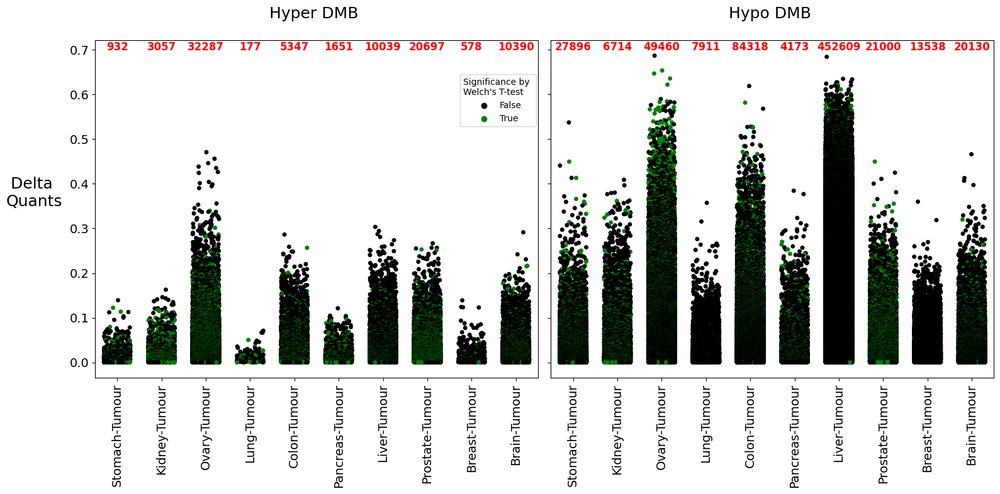

In [13]:
# Filter by delta quants and significance
delta_quants_threshold = 0
t_test_filter = False

df_subset = selected_regions.loc[selected_regions['delta_quants']>delta_quants_threshold]
if t_test_filter:
    df_subset = df_subset.loc[df_subset['significant_dmrs']==True]

# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(1, 2, figsize=(16, 8), sharey=True)


custom_palette = {True: 'green', False: 'black'}

# Plotting data
for ax, hyper_or_hypo in zip(axs, ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
                  data=df_sub, jitter=0.3, dodge=False, ax=ax,
                 palette=custom_palette)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta \nQuants', fontsize=18,rotation=0,labelpad=40)
    ax.set_title(f'{hyper_or_hypo} DMB ', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Count the occurrences for each 'selected_tissue'
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    
    # Annotate the counts above the appropriate x-axis positions
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, 0.68), 
                        textcoords="offset points", xytext=(0,10), ha='center',
                        fontsize=12,
                        color='red',
                        fontweight="bold")

    # Remove the legend from the axes
    ax.get_legend().remove()

# Create a single shared legend for the figure and place it between the plots
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,title="Significance by \nWelch's T-test", bbox_to_anchor=(0.54, 0.85))

plt.tight_layout()
# plt.show()

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# plt.savefig(fig_savedir + f"Tumour_DMBs.delta_quants0.ttest_significance_coloured.png")


### Combined plot

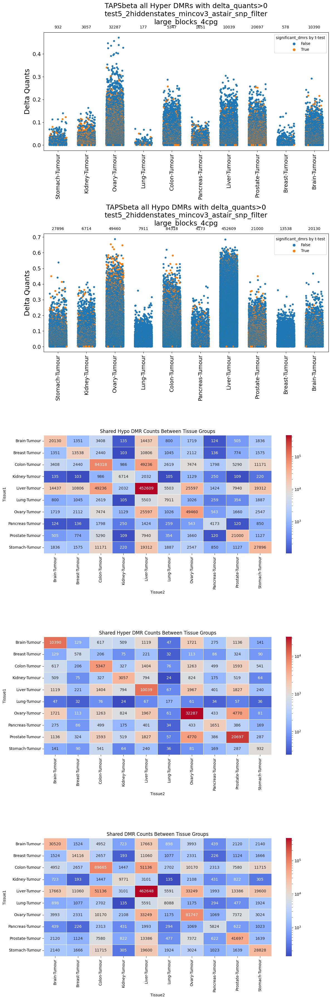

In [14]:

### Filter by delta quants and significance
delta_quants_threshold = 0
t_test_filter = False

df_subset = selected_regions.loc[selected_regions['delta_quants']>delta_quants_threshold]
if t_test_filter:
    df_subset = df_subset.loc[df_subset['significant_dmrs']==True]


# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 36))


for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
                  data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta Quants', fontsize=18)
    ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Change the legend title
    ax.legend_.set_title("significant_dmrs by t-test")
    
    # Count the occurrences for each 'selected_tissue'
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    
    # Annotate the counts above the appropriate x-axis positions
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), 
                        textcoords="offset points", xytext=(0,10), ha='center')






ax = axs[2]
# Plot 2: Heatmap for Hypo
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"]
shared_dmr_counts_df_hypo = generate_shared_dmr_counts_df(df_hypo)
sns.heatmap(shared_dmr_counts_df_hypo, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hypo DMR Counts Between Tissue Groups')

ax = axs[3]
# Plot 3: Heatmap for Hyper
df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"]
shared_dmr_counts_df_hyper = generate_shared_dmr_counts_df(df_hyper)
sns.heatmap(shared_dmr_counts_df_hyper, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hyper DMR Counts Between Tissue Groups')


# Plot 4: Heatmap for All
ax = axs[4]
shared_dmr_counts_df_all = generate_shared_dmr_counts_df(df_subset)
sns.heatmap(shared_dmr_counts_df_all, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared DMR Counts Between Tissue Groups')

# Tight layout to ensure plots do not overlap
plt.tight_layout()
# plt.show()


In [ ]:
# "TAPSbeta.Tumour_vs_healthy_background_DMBs.all_delta_quants0.TAPSbeta_hmm.all_samples.test5_2hiddenstates_mincov3_astair_snp_filter.Filtered_blocks.large_blocks_4cpg.csv

# "

# sys.path.append('/well/ludwig/users/dyp502/code/taps_tissue_atlas_Nov2022/tissue_atlas_codebase/')
# from dmr_functions import grail_find_markers_copy, get_grail_dmrs, plot_hypo_hyper_dmr_heatmap, get_tissue_labels_positions

# fig,ax = plot_hypo_hyper_dmr_heatmap(df_subset[[u for u in df_subset.columns if u in id_tissue_map.keys()]+['Hyper_or_Hypo','selected_tissue']],
#                                     y_label_tissue_groups=True,
#                                     xticklabel_frequency=1,
# #                                     cmap='Spectral_r',
#                                     )



### Normalised

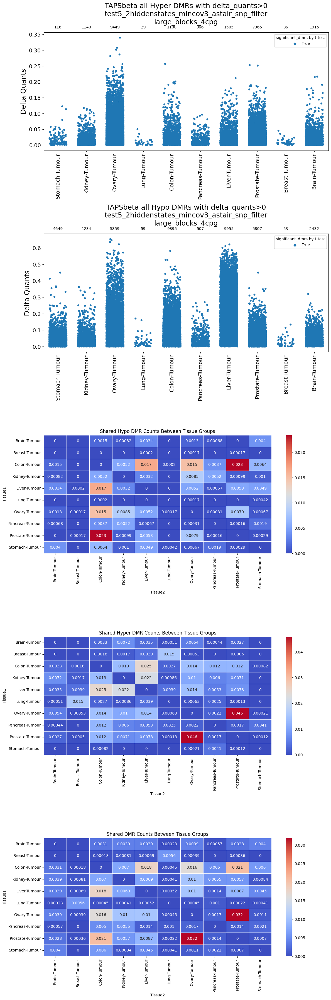

In [15]:

### Filter by delta quants and significance
delta_quants_threshold = 0
t_test_filter = True

df_subset = selected_regions.loc[selected_regions['delta_quants']>delta_quants_threshold]
if t_test_filter:
    df_subset = df_subset.loc[df_subset['significant_dmrs']==True]


# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 36))


for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
                  data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta Quants', fontsize=18)
    ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Change the legend title
    ax.legend_.set_title("significant_dmrs by t-test")
    
    # Count the occurrences for each 'selected_tissue'
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    
    # Annotate the counts above the appropriate x-axis positions
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), 
                        textcoords="offset points", xytext=(0,10), ha='center')








ax = axs[2]
# Plot 2: Heatmap for Hypo
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"]
shared_dmr_counts_df = generate_shared_dmr_counts_df(df_hypo)
total_dmr_counts = np.diag(shared_dmr_counts_df.values)
total_dmrs = pd.DataFrame({
    "Total DMRs": total_dmr_counts
}, index=shared_dmr_counts_df.index)

# Normalizing shared DMR counts by the sum of the total DMRs for the two tissues
normalized_shared_dmrs = shared_dmr_counts_df.copy()
for tissue1 in normalized_shared_dmrs.columns:
    for tissue2 in normalized_shared_dmrs.index:
        sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
        normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs

        
np.fill_diagonal(normalized_shared_dmrs.values, 0)
sns.heatmap(normalized_shared_dmrs, 
            annot=True, 
            cmap='coolwarm',
            linewidths=.5,
            ax=ax
           )



ax.set_title('Shared Hypo DMR Counts Between Tissue Groups')

ax = axs[3]
# Plot 3: Heatmap for Hyper
df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"]
shared_dmr_counts_df = generate_shared_dmr_counts_df(df_hyper)
total_dmr_counts = np.diag(shared_dmr_counts_df.values)
total_dmrs = pd.DataFrame({
    "Total DMRs": total_dmr_counts
}, index=shared_dmr_counts_df.index)

# Normalizing shared DMR counts by the sum of the total DMRs for the two tissues
normalized_shared_dmrs = shared_dmr_counts_df.copy()
for tissue1 in normalized_shared_dmrs.columns:
    for tissue2 in normalized_shared_dmrs.index:
        sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
        normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs

        
np.fill_diagonal(normalized_shared_dmrs.values, 0)
sns.heatmap(normalized_shared_dmrs, 
            annot=True, 
            cmap='coolwarm',
            linewidths=.5,
            ax=ax
           )
ax.set_title('Shared Hyper DMR Counts Between Tissue Groups')


# Plot 4: Heatmap for All
ax = axs[4]
shared_dmr_counts_df = generate_shared_dmr_counts_df(df_subset)
total_dmr_counts = np.diag(shared_dmr_counts_df.values)
total_dmrs = pd.DataFrame({
    "Total DMRs": total_dmr_counts
}, index=shared_dmr_counts_df.index)

# Normalizing shared DMR counts by the sum of the total DMRs for the two tissues
normalized_shared_dmrs = shared_dmr_counts_df.copy()
for tissue1 in normalized_shared_dmrs.columns:
    for tissue2 in normalized_shared_dmrs.index:
        sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
        normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs



np.fill_diagonal(normalized_shared_dmrs.values, 0)
sns.heatmap(normalized_shared_dmrs, 
            annot=True, 
            cmap='coolwarm',
            linewidths=.5,
            ax=ax
           )
ax.set_title('Shared DMR Counts Between Tissue Groups')

# Tight layout to ensure plots do not overlap
plt.tight_layout()
# plt.show()


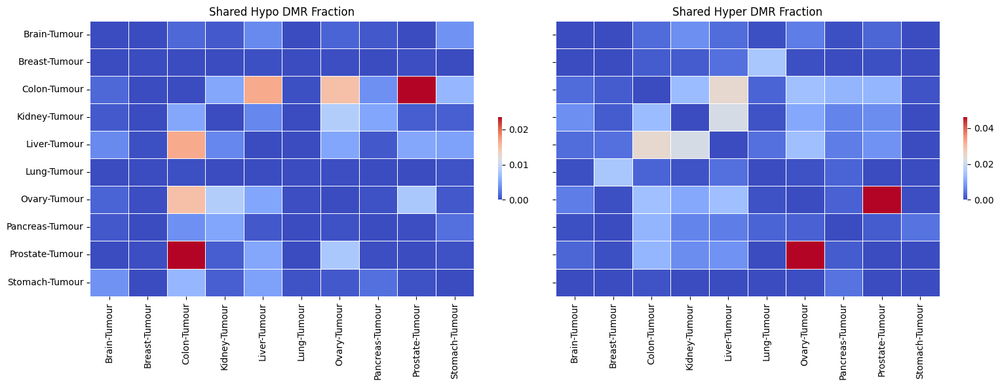

In [16]:

### Filter by delta quants and significance
delta_quants_threshold = 0
t_test_filter = True

df_subset = selected_regions.loc[selected_regions['delta_quants']>delta_quants_threshold]
if t_test_filter:
    df_subset = df_subset.loc[df_subset['significant_dmrs']==True]


# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True)


# for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
#     df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
#     sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
#                   data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
#     ax.tick_params(axis='both', which='major', labelsize=14)
#     ax.set_xlabel('')
#     ax.set_ylabel('Delta Quants', fontsize=18)
#     ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
#     ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
#     # Change the legend title
#     ax.legend_.set_title("significant_dmrs by t-test")
    
#     # Count the occurrences for each 'selected_tissue'
#     count_data = df_sub['selected_tissue'].value_counts().reset_index()
#     count_data.columns = ['selected_tissue', 'counts']
    
#     # Annotate the counts above the appropriate x-axis positions
#     for i, label in enumerate(ax.get_xticklabels()):
#         tissue = label.get_text()
#         count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
#         if len(count) > 0:
#             ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), 
#                         textcoords="offset points", xytext=(0,10), ha='center')






cbar_shrink=0.3

ax = axs[0]
# Plot 2: Heatmap for Hypo
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"]
shared_dmr_counts_df = generate_shared_dmr_counts_df(df_hypo)
total_dmr_counts = np.diag(shared_dmr_counts_df.values)
total_dmrs = pd.DataFrame({
    "Total DMRs": total_dmr_counts
}, index=shared_dmr_counts_df.index)

# Normalizing shared DMR counts by the sum of the total DMRs for the two tissues
normalized_shared_dmrs = shared_dmr_counts_df.copy()
for tissue1 in normalized_shared_dmrs.columns:
    for tissue2 in normalized_shared_dmrs.index:
        sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
        normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs


np.fill_diagonal(normalized_shared_dmrs.values, 0)
sns.heatmap(normalized_shared_dmrs, 
            annot=False, 
            cmap='coolwarm',
            linewidths=.5,
            ax=ax,
            cbar_kws={'shrink':cbar_shrink}
           )

ax.set_ylabel('')
ax.set_xlabel('')

ax.set_title('Shared Hypo DMR Fraction')

ax = axs[1]
# Plot 3: Heatmap for Hyper
df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"]
shared_dmr_counts_df = generate_shared_dmr_counts_df(df_hyper)
total_dmr_counts = np.diag(shared_dmr_counts_df.values)
total_dmrs = pd.DataFrame({
    "Total DMRs": total_dmr_counts
}, index=shared_dmr_counts_df.index)

# Normalizing shared DMR counts by the sum of the total DMRs for the two tissues
normalized_shared_dmrs = shared_dmr_counts_df.copy()
for tissue1 in normalized_shared_dmrs.columns:
    for tissue2 in normalized_shared_dmrs.index:
        sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
        normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs

        


        
np.fill_diagonal(normalized_shared_dmrs.values, 0)
sns.heatmap(normalized_shared_dmrs, 
            annot=False,
            cmap='coolwarm',
            linewidths=.5,
            ax=ax,
            cbar_kws={'shrink':cbar_shrink}
           )
ax.set_title('Shared Hyper DMR Fraction')

ax.set_ylabel('')
ax.set_xlabel('')

# # Plot 4: Heatmap for All
# ax = axs[4]
# shared_dmr_counts_df = generate_shared_dmr_counts_df(df_subset)
# total_dmr_counts = np.diag(shared_dmr_counts_df.values)
# total_dmrs = pd.DataFrame({
#     "Total DMRs": total_dmr_counts
# }, index=shared_dmr_counts_df.index)

# # Normalizing shared DMR counts by the sum of the total DMRs for the two tissues
# normalized_shared_dmrs = shared_dmr_counts_df.copy()
# for tissue1 in normalized_shared_dmrs.columns:
#     for tissue2 in normalized_shared_dmrs.index:
#         sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
#         normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs



# np.fill_diagonal(normalized_shared_dmrs.values, 0)
# sns.heatmap(normalized_shared_dmrs, 
#             annot=True, 
#             cmap='coolwarm',
#             linewidths=.5,
#             ax=ax
#            )
# ax.set_title('Shared DMR Counts Between Tissue Groups')

# # Tight layout to ensure plots do not overlap
plt.tight_layout()

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# plt.savefig(fig_savedir + f"Tumour_DMBs.heatmap_shared_dmbs_proportions.delta_quants0_ttest_filtered.png")

# plt.show()


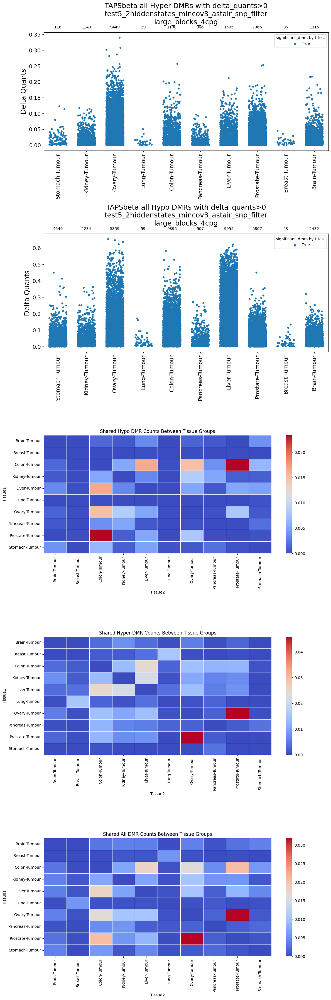

In [17]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

def custom_heatmap(*args, **kwargs):
    # Draw the heatmap
    ax = sns.heatmap(*args, **kwargs)

    # Retrieve the matrix of data and the matrix of annotations
    data = args[0]
    annot = kwargs.get('annot', False)

    if annot:
        # Loop over data dimensions and create text annotations
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                value = data.iloc[i, j]
                if isinstance(value, (int, np.integer)):
                    text = f"{value:d}"
                elif isinstance(value, (float, np.float)):
                    text = f"{value:.2f}"
                else:
                    text = str(value)
                ax.text(j + 0.5, i + 0.5, text, ha="center", va="center", color="black")

    return ax

### Filter by delta quants and significance
delta_quants_threshold = 0
t_test_filter = True
normalize = True  # Set this to True or False as needed

df_subset = selected_regions.loc[selected_regions['delta_quants'] > delta_quants_threshold]
if t_test_filter:
    df_subset = df_subset.loc[df_subset['significant_dmrs'] == True]

# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 36))

# Strip plots for Hyper and Hypo
for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta Quants', fontsize=18)
    ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.legend_.set_title("significant_dmrs by t-test")
    
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), textcoords="offset points", xytext=(0,10), ha='center')

# Heatmaps for Hypo, Hyper, and All
for ax, hyper_or_hypo in zip(axs[2:], ["Hypo", "Hyper", "All"]):
    if hyper_or_hypo != "All":
        df_cond = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    else:
        df_cond = df_subset

    shared_dmr_counts_df = generate_shared_dmr_counts_df(df_cond)
    
    if normalize:
        total_dmr_counts = np.diag(shared_dmr_counts_df.values)
        total_dmrs = pd.DataFrame({"Total DMRs": total_dmr_counts}, index=shared_dmr_counts_df.index)
        normalized_shared_dmrs = shared_dmr_counts_df.copy()

        for tissue1 in normalized_shared_dmrs.columns:
            for tissue2 in normalized_shared_dmrs.index:
                sum_of_dmrs = total_dmrs.loc[tissue1, "Total DMRs"] + total_dmrs.loc[tissue2, "Total DMRs"]
                normalized_shared_dmrs.loc[tissue2, tissue1] /= sum_of_dmrs
        np.fill_diagonal(normalized_shared_dmrs.values, 0)
        data_to_plot = normalized_shared_dmrs
    else:
        data_to_plot = shared_dmr_counts_df

    custom_heatmap(data_to_plot, annot=False, cmap='coolwarm', linewidths=.5, norm=LogNorm() if not normalize else None, ax=ax)
    ax.set_title(f'Shared {hyper_or_hypo} DMR Counts Between Tissue Groups')

plt.tight_layout()
plt.show()


### Delta_quants > 0.1

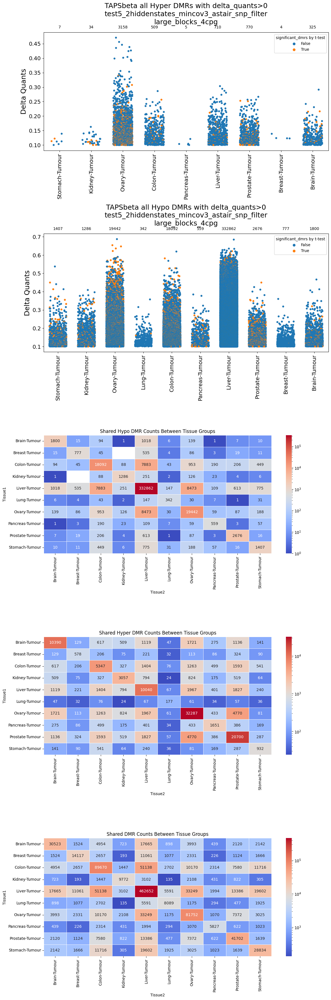

In [18]:
df_subset = selected_regions.loc[selected_regions['delta_quants']>0.1]

df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"].copy()
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"].copy()
df_hypo['delta_quants'] = df_hypo['delta_quants'] * -1  # Make delta_quants negative for "Hypo"
df_combined = pd.concat([df_hyper, df_hypo])

# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 36))


for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
                  data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta Quants', fontsize=18)
    ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Change the legend title
    ax.legend_.set_title("significant_dmrs by t-test")
    
    # Count the occurrences for each 'selected_tissue'
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    
    # Annotate the counts above the appropriate x-axis positions
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), 
                        textcoords="offset points", xytext=(0,10), ha='center')






df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"].copy()
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"].copy()




ax = axs[2]
# Plot 2: Heatmap for Hypo
shared_dmr_counts_df_hypo = generate_shared_dmr_counts_df(df_hypo)
sns.heatmap(shared_dmr_counts_df_hypo, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hypo DMR Counts Between Tissue Groups')

ax = axs[3]
# Plot 3: Heatmap for Hyper
df_hyper = selected_regions.loc[selected_regions['Hyper_or_Hypo'] == "Hyper"]
shared_dmr_counts_df_hyper = generate_shared_dmr_counts_df(df_hyper)
sns.heatmap(shared_dmr_counts_df_hyper, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hyper DMR Counts Between Tissue Groups')


# Plot 4: Heatmap for All
ax = axs[4]
shared_dmr_counts_df_all = generate_shared_dmr_counts_df(selected_regions)
sns.heatmap(shared_dmr_counts_df_all, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared DMR Counts Between Tissue Groups')

# Tight layout to ensure plots do not overlap
plt.tight_layout()
# plt.show()


### T-test significant

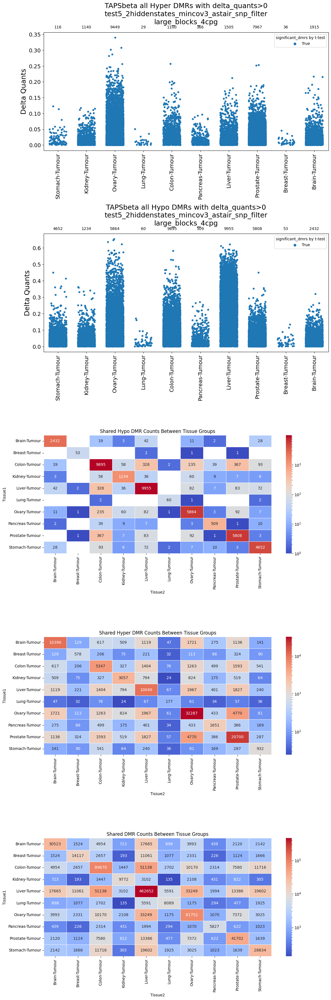

In [19]:
df_subset = selected_regions.loc[selected_regions['significant_dmrs']==True]

df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"].copy()
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"].copy()
df_hypo['delta_quants'] = df_hypo['delta_quants'] * -1  # Make delta_quants negative for "Hypo"
df_combined = pd.concat([df_hyper, df_hypo])

# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 36))


for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
                  data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta Quants', fontsize=18)
    ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Change the legend title
    ax.legend_.set_title("significant_dmrs by t-test")
    
    # Count the occurrences for each 'selected_tissue'
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    
    # Annotate the counts above the appropriate x-axis positions
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), 
                        textcoords="offset points", xytext=(0,10), ha='center')






df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"].copy()
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"].copy()

# Function to generate shared_dmr_counts_df for heatmaps
def generate_shared_dmr_counts_df(df, link_character='_'):
    shared_dmrs = df.groupby("selected_tissue").apply(lambda x: x.index).to_dict()
    shared_dmr_counts = {}
    for tissue1, dmrs1 in shared_dmrs.items():
        for tissue2, dmrs2 in shared_dmrs.items():
            shared_key = f"{tissue1}{link_character}{tissue2}"
            shared_dmr_counts[shared_key] = len(set(dmrs1) & set(dmrs2))
    
    shared_dmr_counts_df = pd.Series(shared_dmr_counts).reset_index()
    shared_dmr_counts_df[['Tissue1', 'Tissue2']] = shared_dmr_counts_df['index'].str.split(link_character, expand=True)
    shared_dmr_counts_df = shared_dmr_counts_df.pivot('Tissue1', 'Tissue2', 0).fillna(0)
    shared_dmr_counts_df = shared_dmr_counts_df.reindex(index=[u for u in tissue_order if u in list(shared_dmr_counts_df.index)], columns=[u for u in tissue_order if u in shared_dmr_counts_df.columns])
    return shared_dmr_counts_df


ax = axs[2]
# Plot 2: Heatmap for Hypo
shared_dmr_counts_df_hypo = generate_shared_dmr_counts_df(df_hypo)
sns.heatmap(shared_dmr_counts_df_hypo, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hypo DMR Counts Between Tissue Groups')

ax = axs[3]
# Plot 3: Heatmap for Hyper
df_hyper = selected_regions.loc[selected_regions['Hyper_or_Hypo'] == "Hyper"]
shared_dmr_counts_df_hyper = generate_shared_dmr_counts_df(df_hyper)
sns.heatmap(shared_dmr_counts_df_hyper, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hyper DMR Counts Between Tissue Groups')


# Plot 4: Heatmap for All
ax = axs[4]
shared_dmr_counts_df_all = generate_shared_dmr_counts_df(selected_regions)
sns.heatmap(shared_dmr_counts_df_all, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared DMR Counts Between Tissue Groups')

# Tight layout to ensure plots do not overlap
plt.tight_layout()
# plt.show()


### Next steps

- Normalise shared DMB counts by total number of DMBs

- Look at shared DMBs in tumour, eg liver tumour and colon-tumour, and compare with healthy DMBs - eg do liver and pancreas share DMBs in healthy but not in cancer?

- What is our final method for finding tissue specific DMBs? KNN, PCA? Can we somehow get weights for tissue-specific clustering (eg in t-SNE)? NMF on all data - may be simpler on all tissues?

- Cluster by shared DMBs - maybe choose top_n to avoid just clustering by liver-tumour DMBs

- Find the most convincing pan-cancer DMBs from bottom up approach and ask:
    - What tumour samples tend share DMBs?
    - Export as csv and share for downstream analysis, eg gene enrichment?

### Delta_quants > 0.1 and significant t-test

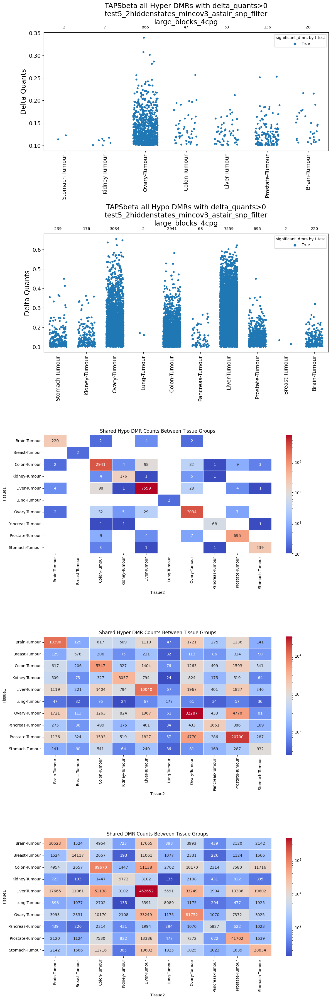

In [20]:
df_subset = selected_regions.loc[(selected_regions['significant_dmrs']==True)& (selected_regions['delta_quants']>0.1)]

df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"].copy()
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"].copy()
df_hypo['delta_quants'] = df_hypo['delta_quants'] * -1  # Make delta_quants negative for "Hypo"
df_combined = pd.concat([df_hyper, df_hypo])

# Create a single figure with multiple rows and 1 column
fig, axs = plt.subplots(5, 1, figsize=(12, 36))


for ax, hyper_or_hypo in zip(axs[:2], ["Hyper", "Hypo"]):
    df_sub = df_subset.loc[df_subset['Hyper_or_Hypo'] == hyper_or_hypo]
    sns.stripplot(x='selected_tissue', y='delta_quants', hue='significant_dmrs', 
                  data=df_sub, jitter=0.3, dodge=False, ax=ax)
    
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel('')
    ax.set_ylabel('Delta Quants', fontsize=18)
    ax.set_title(f'{exp} all {hyper_or_hypo} DMRs with delta_quants>0\n{test_name}\n{filter_name}', fontsize=18, y=1.05)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Change the legend title
    ax.legend_.set_title("significant_dmrs by t-test")
    
    # Count the occurrences for each 'selected_tissue'
    count_data = df_sub['selected_tissue'].value_counts().reset_index()
    count_data.columns = ['selected_tissue', 'counts']
    
    # Annotate the counts above the appropriate x-axis positions
    for i, label in enumerate(ax.get_xticklabels()):
        tissue = label.get_text()
        count = count_data.loc[count_data['selected_tissue'] == tissue, 'counts'].values
        if len(count) > 0:
            ax.annotate(f'{count[0]}', (i, ax.get_ylim()[1]), 
                        textcoords="offset points", xytext=(0,10), ha='center')






df_hyper = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hyper"].copy()
df_hypo = df_subset.loc[df_subset['Hyper_or_Hypo'] == "Hypo"].copy()

# Function to generate shared_dmr_counts_df for heatmaps
def generate_shared_dmr_counts_df(df, link_character='_'):
    shared_dmrs = df.groupby("selected_tissue").apply(lambda x: x.index).to_dict()
    shared_dmr_counts = {}
    for tissue1, dmrs1 in shared_dmrs.items():
        for tissue2, dmrs2 in shared_dmrs.items():
            shared_key = f"{tissue1}{link_character}{tissue2}"
            shared_dmr_counts[shared_key] = len(set(dmrs1) & set(dmrs2))
    
    shared_dmr_counts_df = pd.Series(shared_dmr_counts).reset_index()
    shared_dmr_counts_df[['Tissue1', 'Tissue2']] = shared_dmr_counts_df['index'].str.split(link_character, expand=True)
    shared_dmr_counts_df = shared_dmr_counts_df.pivot('Tissue1', 'Tissue2', 0).fillna(0)
    shared_dmr_counts_df = shared_dmr_counts_df.reindex(index=[u for u in tissue_order if u in list(shared_dmr_counts_df.index)], columns=[u for u in tissue_order if u in shared_dmr_counts_df.columns])
    return shared_dmr_counts_df


ax = axs[2]
# Plot 2: Heatmap for Hypo
shared_dmr_counts_df_hypo = generate_shared_dmr_counts_df(df_hypo)
sns.heatmap(shared_dmr_counts_df_hypo, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hypo DMR Counts Between Tissue Groups')

ax = axs[3]
# Plot 3: Heatmap for Hyper
df_hyper = selected_regions.loc[selected_regions['Hyper_or_Hypo'] == "Hyper"]
shared_dmr_counts_df_hyper = generate_shared_dmr_counts_df(df_hyper)
sns.heatmap(shared_dmr_counts_df_hyper, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared Hyper DMR Counts Between Tissue Groups')


# Plot 4: Heatmap for All
ax = axs[4]
shared_dmr_counts_df_all = generate_shared_dmr_counts_df(selected_regions)
sns.heatmap(shared_dmr_counts_df_all, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5,
            norm=LogNorm(),
            ax=ax)
ax.set_title('Shared DMR Counts Between Tissue Groups')

# Tight layout to ensure plots do not overlap
plt.tight_layout()
# plt.show()


### Shared between more than two tissue types

In [21]:
df = dmbs
tissue_samples_mr = df[[u for u in df.columns if u in list(id_tissue_map.keys())]]

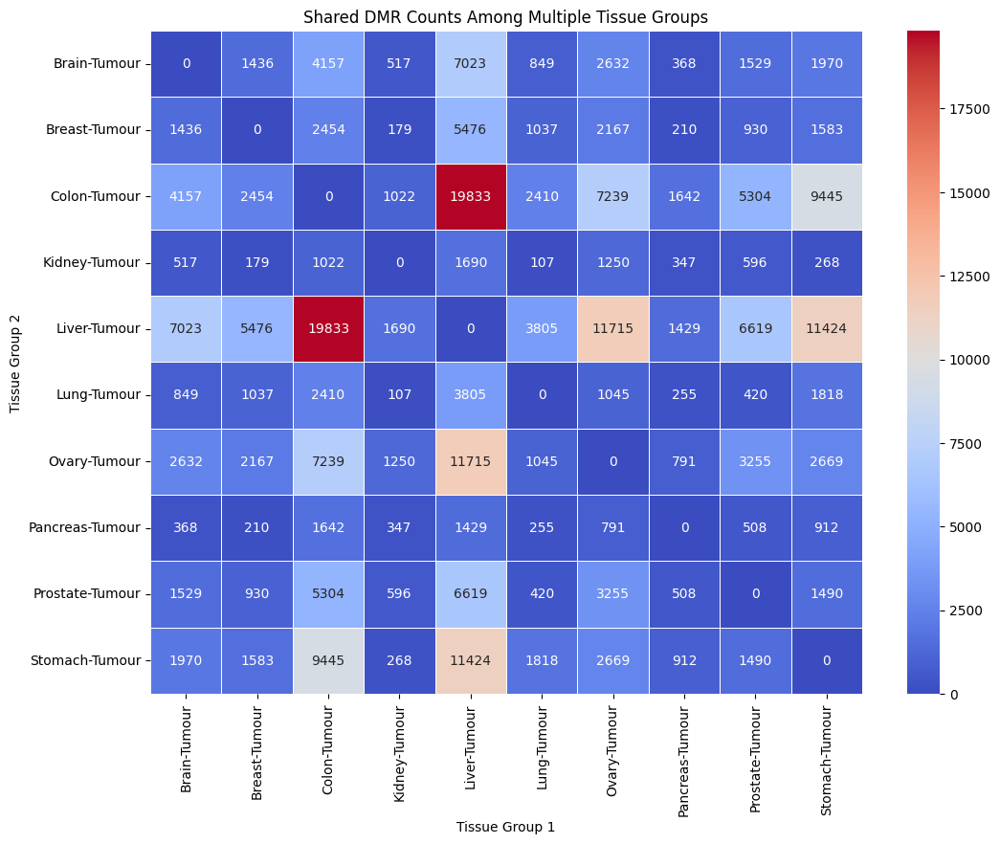

In [22]:
from collections import defaultdict
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize a defaultdict to store DMRs and the tissues they are found in
dmr_to_tissues = defaultdict(set)

# Populate the defaultdict
for tissue, dmrs in shared_dmrs.items():
    for dmr in dmrs:
        dmr_to_tissues[dmr].add(tissue)

# Find DMRs that are shared among multiple tissues
shared_mult_tissue_dmrs = {dmr: tissues for dmr, tissues in dmr_to_tissues.items() if len(tissues) > 2}

# Create a DataFrame to visualize the shared DMR counts among multiple tissues
# Initialize a DataFrame with zeros
tissues = list(shared_dmrs.keys())
multi_tissue_counts_df = pd.DataFrame(0, index=tissues, columns=tissues)

# Populate the DataFrame
for dmr, tissues in shared_mult_tissue_dmrs.items():
    for tissue1 in tissues:
        for tissue2 in tissues:
            if tissue1 != tissue2:
                multi_tissue_counts_df.loc[tissue1, tissue2] += 1

# Set diagonal values to 0
np.fill_diagonal(multi_tissue_counts_df.values, 0)

# Plotting the heatmap
plt.figure(figsize=(12, 9))
sns.heatmap(multi_tissue_counts_df, 
            annot=True, 
            cmap='coolwarm',
            fmt='g',
            linewidths=.5)
plt.title('Shared DMR Counts Among Multiple Tissue Groups')
plt.xlabel('Tissue Group 1')
plt.ylabel('Tissue Group 2')
plt.show()


In [23]:
df = dmbs

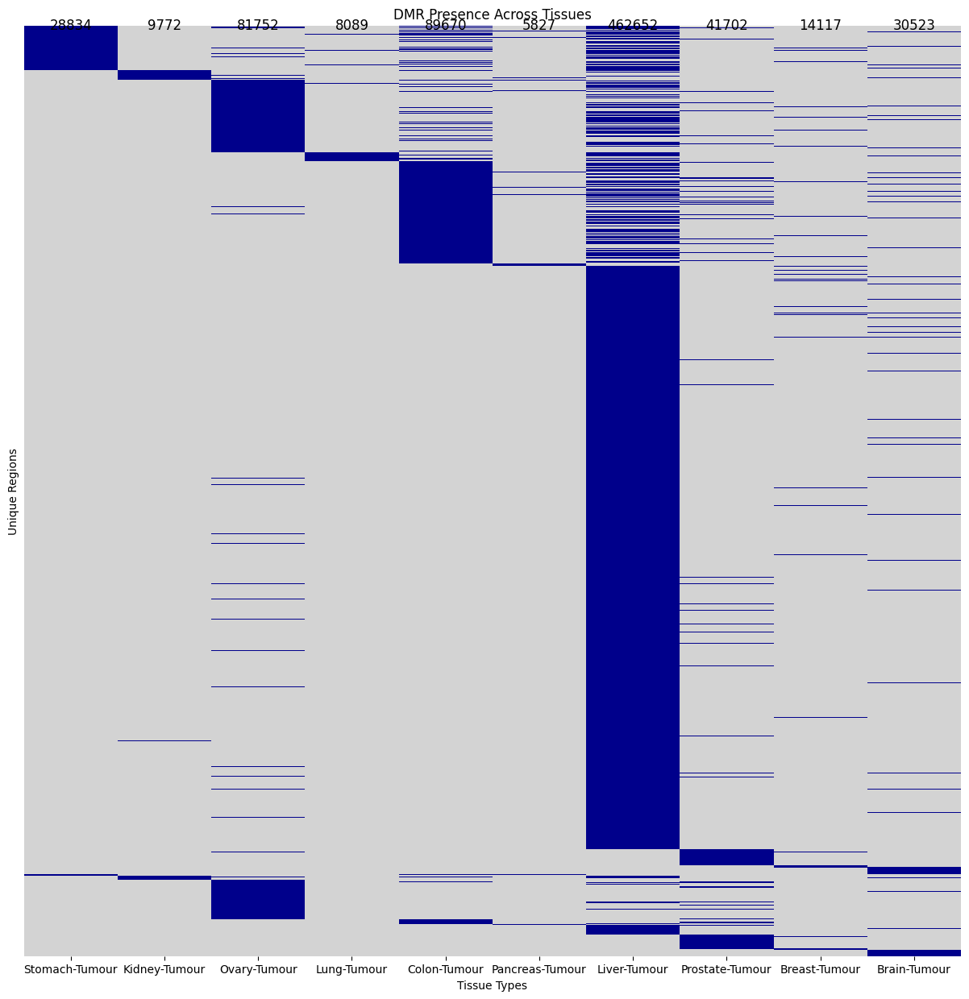

In [24]:
import matplotlib.colors as mcolors

# Create a custom colormap
cmap = mcolors.ListedColormap(['#D3D3D3', 'darkblue'])  # Light grey for 0, dark blue for 1

# Extract unique regions and tissues
unique_regions = df.index.unique()
unique_tissues = df['selected_tissue'].unique()

# Initialize a DataFrame with zeros
binary_dmr_df = pd.DataFrame(0, index=unique_regions, columns=unique_tissues)

# Populate the DataFrame
dmr_counts = {}
for tissue in unique_tissues:
    tissue_df = df[df['selected_tissue'] == tissue]
    dmr_counts[tissue] = len(tissue_df)
    for region in tissue_df.index:
        binary_dmr_df.loc[region, tissue] = 1

# Plotting the heatmap
fig, ax = plt.subplots(figsize=(15, 15))
sns.heatmap(binary_dmr_df, 
            cmap=cmap, 
            cbar=False, 
            yticklabels=False,
#             linewidths=.5,   # Gridline width
#             linecolor='white',  # Gridline color
            ax=ax)
plt.title('DMR Presence Across Tissues')
plt.xlabel('Tissue Types')
plt.ylabel('Unique Regions')

# Annotate the total number of DMRs for each tissue
for i, tissue in enumerate(binary_dmr_df.columns):
    plt.text(i + 0.5, -0.5, str(dmr_counts[tissue]), 
             verticalalignment='center', 
             horizontalalignment='center', 
             fontsize=12,
             color='black')

plt.show()


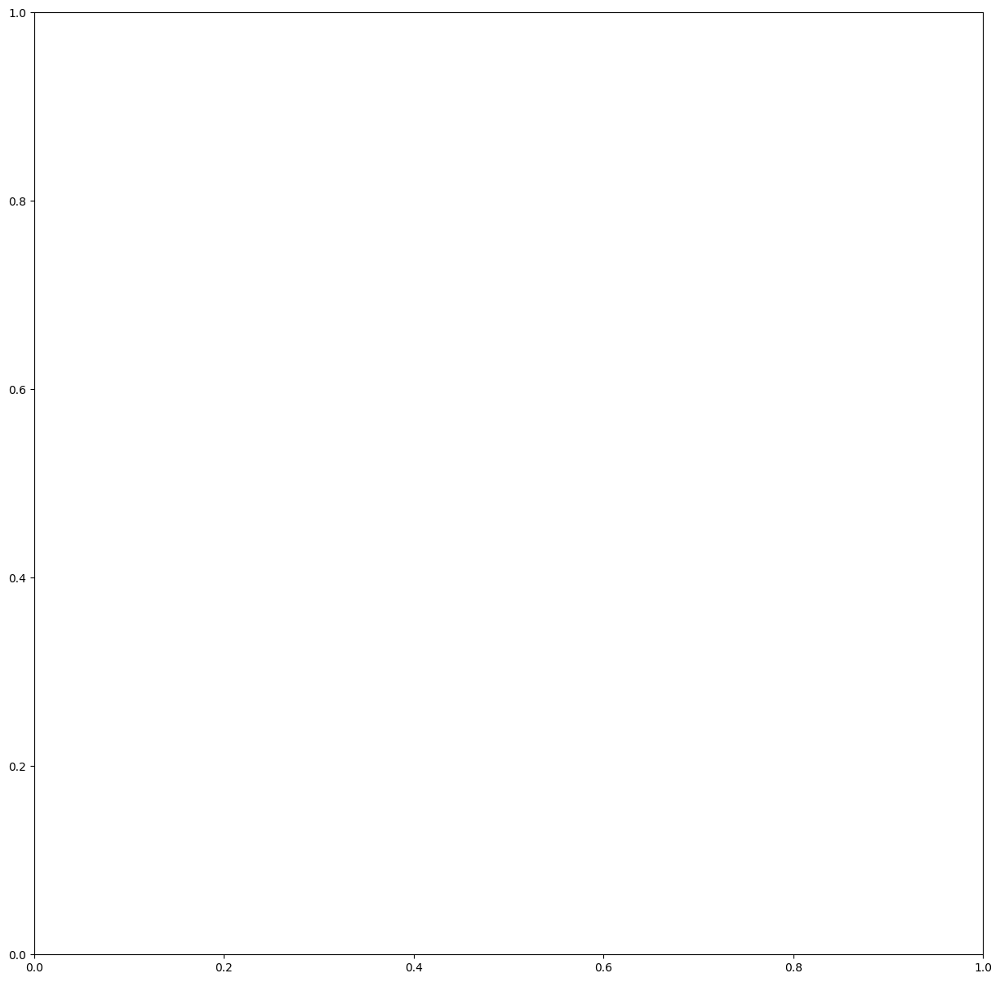

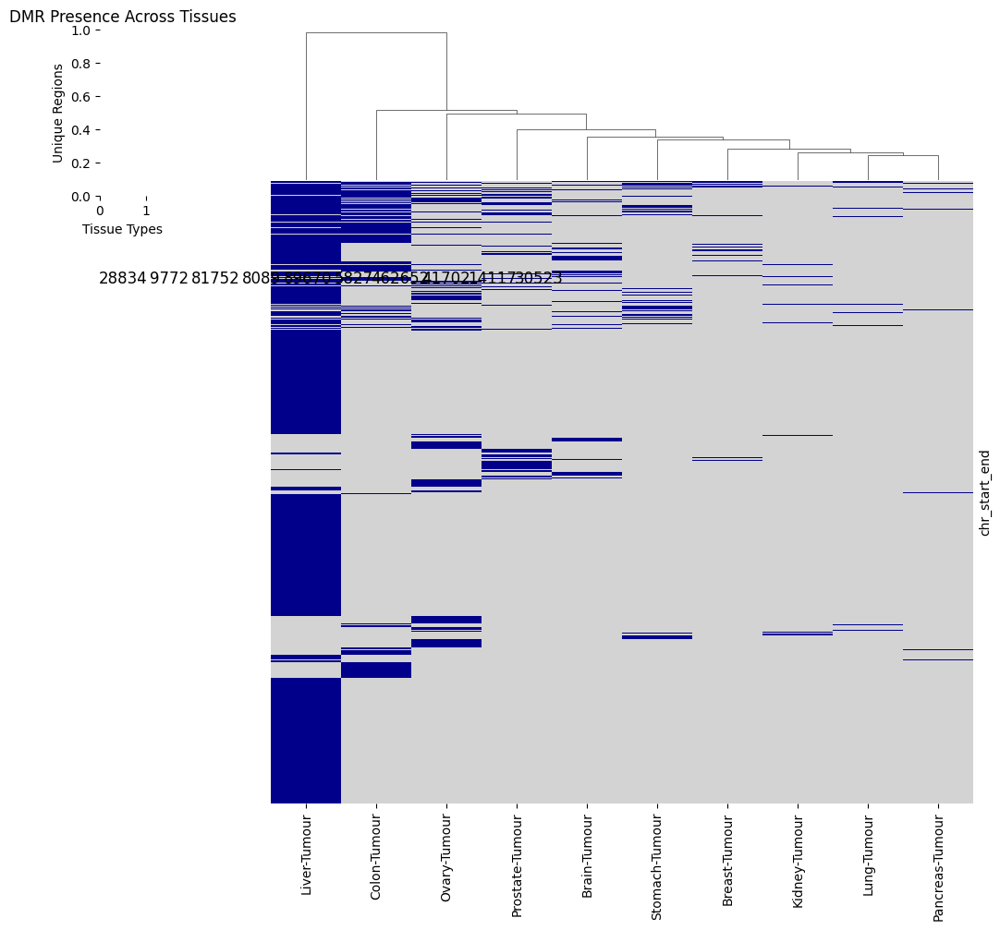

In [25]:
import matplotlib.colors as mcolors
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Create a custom colormap
cmap = mcolors.ListedColormap(['#D3D3D3', 'darkblue'])  # Light grey for 0, dark blue for 1

# Extract unique regions and tissues
unique_regions = df.index.unique()
unique_tissues = df['selected_tissue'].unique()

# Initialize a DataFrame with zeros
binary_dmr_df = pd.DataFrame(0, index=unique_regions, columns=unique_tissues)

# Populate the DataFrame
dmr_counts = {}
for tissue in unique_tissues:
    tissue_df = df[df['selected_tissue'] == tissue]
    dmr_counts[tissue] = len(tissue_df)
    for region in tissue_df.index:
        binary_dmr_df.loc[region, tissue] = 1

# Add a row summary for the number of tissues each DMR is present in
binary_dmr_df['Sum'] = binary_dmr_df.sum(axis=1)

# Plotting the heatmap with hierarchical clustering
fig, ax = plt.subplots(figsize=(15, 15))
sns.clustermap(binary_dmr_df.sort_values('Sum', ascending=False).drop('Sum', axis=1), 
               cmap=cmap, 
               cbar=False, 
               yticklabels=False, 
               row_cluster=False,  # Turn this on if you also want to cluster rows
               col_cluster=True,
#                linewidths=.5,
#                linecolor='white',
              )

# Additional title and labels
plt.title('DMR Presence Across Tissues')
plt.xlabel('Tissue Types')
plt.ylabel('Unique Regions')

# Annotate the total number of DMRs for each tissue
for i, tissue in enumerate(binary_dmr_df.columns[:-1]):  # Exclude 'Sum'
    plt.text(i + 0.5, -0.5, str(dmr_counts[tissue]), 
             verticalalignment='center', 
             horizontalalignment='center', 
             fontsize=12,
             color='black')

plt.show()


In [26]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# import matplotlib.colors as mcolors

# # Initialize a DataFrame with zeros
# binary_dmr_df = pd.DataFrame(0, index=df.index.unique(), columns=df['selected_tissue'].unique())

# # Populate the DataFrame
# for tissue in binary_dmr_df.columns:
#     tissue_df = df[df['selected_tissue'] == tissue]
#     for region in tissue_df.index:
#         binary_dmr_df.loc[region, tissue] = 1

# # Calculate the number of tissues each DMR is found in
# dmr_shared_count = binary_dmr_df.sum(axis=1)

# # Replace the binary values in binary_dmr_df with the shared count for each DMR
# for region in binary_dmr_df.index:
#     binary_dmr_df.loc[region] = binary_dmr_df.loc[region] * dmr_shared_count[region]

# # Create a custom colormap
# cmap = mcolors.ListedColormap(['#D3D3D3', 'darkblue', 'green', 'red', 'purple', 'orange'])

# # Plotting the heatmap
# fig, ax = plt.subplots(figsize=(15, 15))
# sns.heatmap(binary_dmr_df, 
#             cmap=cmap, 
#             cbar=False, 
#             yticklabels=False,
# #             linewidths=.5,  # Gridline width
# #             linecolor='black',
#            )  # Gridline color
# plt.title('DMR Presence Across Tissues')
# plt.xlabel('Tissue Types')
# plt.ylabel('Unique Regions')

# # Annotate the total number of DMRs for each tissue
# dmr_counts = binary_dmr_df.sum()
# for i, tissue in enumerate(binary_dmr_df.columns):
#     plt.text(i + 0.5, -0.5, str(dmr_counts[tissue]), 
#              verticalalignment='center', 
#              horizontalalignment='center', 
#              fontsize=12,
#              color='black')

# plt.show()


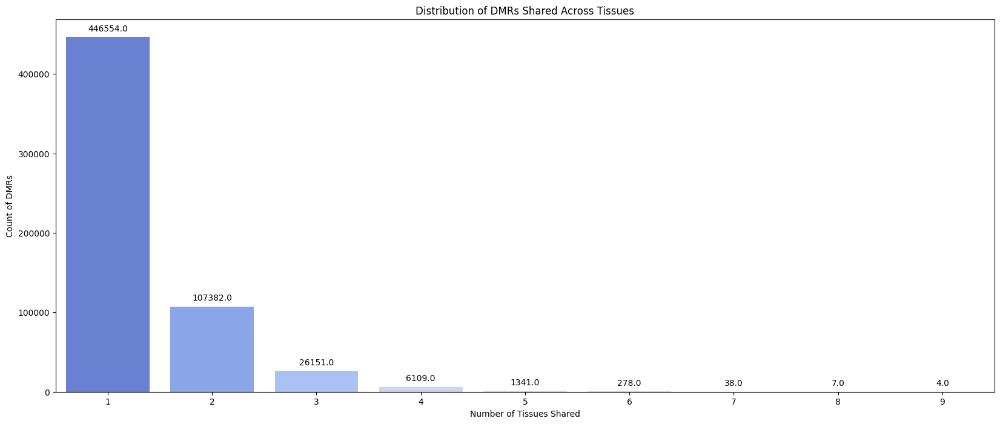

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize a DataFrame with zeros
binary_dmr_df = pd.DataFrame(0, index=df.index.unique(), columns=df['selected_tissue'].unique())

# Populate the DataFrame
for tissue in binary_dmr_df.columns:
    tissue_df = df[df['selected_tissue'] == tissue]
    for region in tissue_df.index:
        binary_dmr_df.loc[region, tissue] = 1

# Calculate the number of tissues each DMR is found in
dmr_shared_count = binary_dmr_df.sum(axis=1).reset_index()
dmr_shared_count.columns = ['DMR', 'Shared_Count']

# Create a bar plot
plt.figure(figsize=(20, 8))
ax = sns.countplot(data=dmr_shared_count, x='Shared_Count', palette='coolwarm')

# Annotate the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.title('Distribution of DMRs Shared Across Tissues')
plt.xlabel('Number of Tissues Shared')
plt.ylabel('Count of DMRs')
plt.show()


### DMBs shared between 2 or more

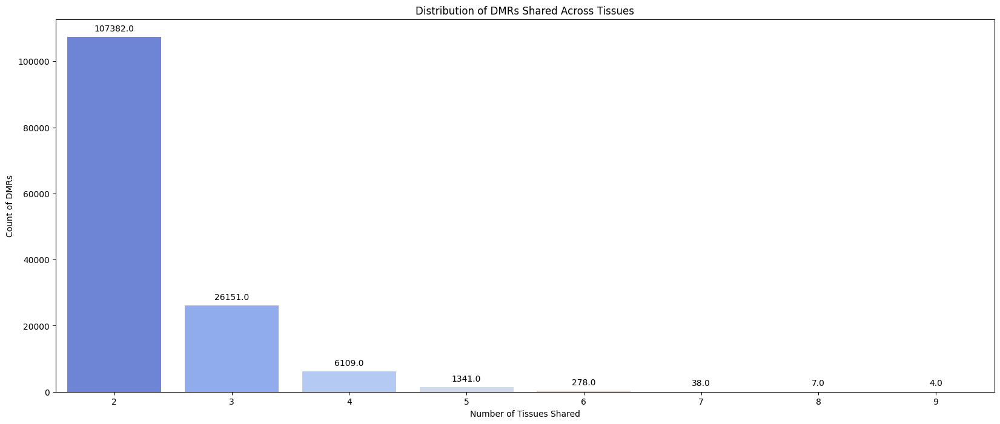

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize a DataFrame with zeros
binary_dmr_df = pd.DataFrame(0, index=df.index.unique(), columns=df['selected_tissue'].unique())

# Populate the DataFrame
for tissue in binary_dmr_df.columns:
    tissue_df = df[df['selected_tissue'] == tissue]
    for region in tissue_df.index:
        binary_dmr_df.loc[region, tissue] = 1

# Calculate the number of tissues each DMR is found in
subset = binary_dmr_df.loc[binary_dmr_df.sum(axis=1)>1]
dmr_shared_count = subset.sum(axis=1).reset_index()
dmr_shared_count.columns = ['DMR', 'Shared_Count']






## Get whether each shared DMB is hyper hypo or mixed
def determine_value_or_mixed(group):
    unique_values = group.unique()
    if len(unique_values) == 1:
        return unique_values[0]
    else:
        return 'mixed'

region_to_hyper_or_hypo = dmbs.loc[dmr_shared_count['DMR']].reset_index().groupby('chr_start_end')['Hyper_or_Hypo'].apply(determine_value_or_mixed)
region_to_hyper_or_hypo_dict = region_to_hyper_or_hypo.to_dict()

dmr_shared_count['label'] = dmr_shared_count['DMR'].map(region_to_hyper_or_hypo_dict)



# Create a bar plot
plt.figure(figsize=(20, 8))
ax = sns.countplot(data=dmr_shared_count, x='Shared_Count', palette='coolwarm')

# Annotate the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.title('Distribution of DMRs Shared Across Tissues')
plt.xlabel('Number of Tissues Shared')
plt.ylabel('Count of DMRs')
plt.show()


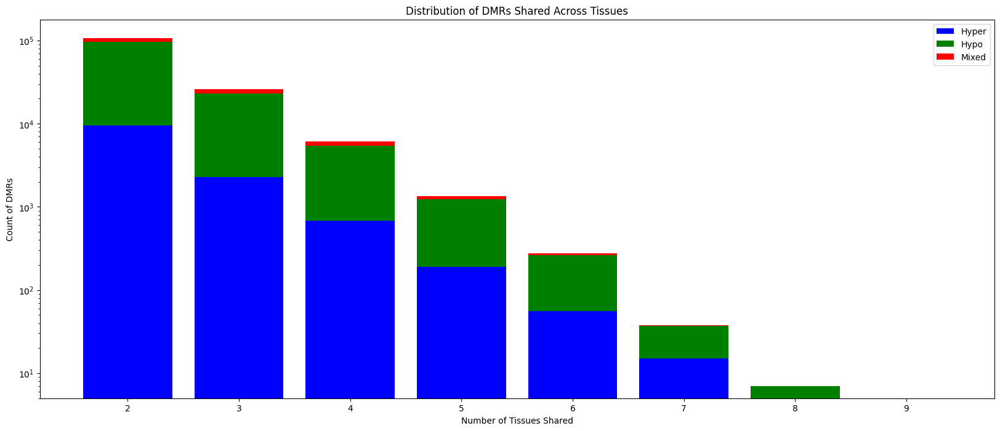

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

# Your existing dmr_shared_count DataFrame
# ...

# Create a complete list of all 'Shared_Count' values
all_shared_counts = sorted(dmr_shared_count['Shared_Count'].unique())

# Initialize counts for each category with zeros
counts = {label: [0] * len(all_shared_counts) for label in ['Hyper', 'Hypo', 'mixed']}
shared_count_index = {count: i for i, count in enumerate(all_shared_counts)}

# Count the occurrences for each 'Shared_Count' value in each label category
for _, row in dmr_shared_count.iterrows():
    counts[row['label']][shared_count_index[row['Shared_Count']]] += 1

# Convert counts to DataFrame for easier plotting
counts_df = pd.DataFrame(counts, index=all_shared_counts)

# Create a bar plot with stacked bars
plt.figure(figsize=(20, 8))

# Plot each subset
plt.bar(counts_df.index, counts_df['Hyper'], label='Hyper', color='blue')
plt.bar(counts_df.index, counts_df['Hypo'], bottom=counts_df['Hyper'], label='Hypo', color='green')
plt.bar(counts_df.index, counts_df['mixed'], bottom=counts_df['Hyper'] + counts_df['Hypo'], label='Mixed', color='red')

# Set y-axis to logarithmic scale
plt.yscale('log')

# Adding labels and title
plt.title('Distribution of DMRs Shared Across Tissues')
plt.xlabel('Number of Tissues Shared')
plt.ylabel('Count of DMRs')
plt.legend()

# Show the plot
plt.show()


In [30]:
counts_df

,Hyper,Hypo,mixed
2,9451,87214,10717
3,2280,20808,3063
4,679,4757,673
5,189,1054,98
6,56,205,17
7,15,22,1
8,5,2,0
9,4,0,0


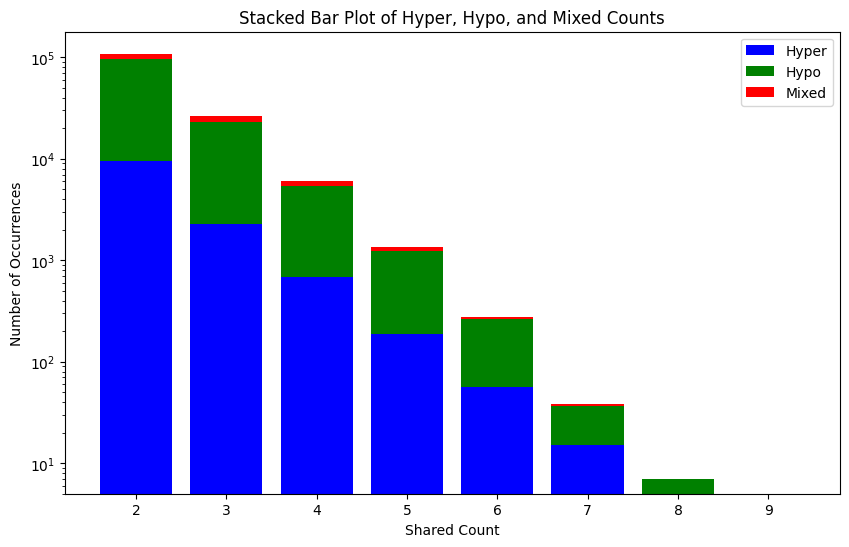

In [31]:
# df = pd.DataFrame(data, index=[2, 3, 4, 5, 6, 7, 8, 9])
df = counts_df
# Plotting
plt.figure(figsize=(10, 6))

# Stacked bar plot
plt.bar(df.index, df['Hyper'], label='Hyper', color='blue')
plt.bar(df.index, df['Hypo'], bottom=df['Hyper'], label='Hypo', color='green')
plt.bar(df.index, df['mixed'], bottom=df['Hyper'] + df['Hypo'], label='Mixed', color='red')

# Adding labels and title
plt.title('Stacked Bar Plot of Hyper, Hypo, and Mixed Counts')
plt.xlabel('Shared Count')
plt.ylabel('Number of Occurrences')
plt.xticks(df.index)
plt.legend()

plt.yscale('log')

# Show plot
plt.show()

In [32]:
dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]

,DMR,Shared_Count,label
26,chr11_7861071_7861374,6,Hypo
42,chr7_141985784_141985914,6,Hypo
45,chr2_117622684_117623422,6,Hypo
46,chr7_157039717_157040014,6,Hypo
136,chr1_241945209_241945279,7,Hypo
...,...,...,...
134518,chr11_70365929_70366762,6,Hyper
135172,chr1_90710069_90734299,7,Hyper
137490,chr1_145475146_145476885,6,Hyper
137593,chr9_121620746_121621670,7,Hyper


In [33]:
dmr_shared_count.loc[dmr_shared_count['Shared_Count']>6].shape

(49, 3)

In [34]:
dmr_shared_count.sort_values(by='Shared_Count',ascending=False).head(n=15)

,DMR,Shared_Count,label
128915,chr8_66960671_66963826,9,Hyper
129120,chr8_70068696_70073108,9,Hyper
128839,chr1_118982389_118995531,9,Hyper
128707,chr20_21098420_21106887,9,Hyper
128785,chr14_56794073_56799814,8,Hyper
128824,chr14_56802650_56818457,8,Hyper
319,chr2_116553028_116553153,8,Hypo
129253,chr20_44809216_44811082,8,Hyper
17745,chr1_159371585_159373744,8,Hypo
129138,chr17_36930797_36946720,8,Hyper


In [35]:
# fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# savename = fig_savedir + f"mc_hyper_shared_dmb1.{dmr_index}.scatterplot.png"

dmr_savedir = "/well/ludwig/users/dyp502/tissue_atlas_v3/dmr11/"
# dmr_shared_count.sort_values(by='Shared_Count',ascending=False).to_csv(dmr_savedir + f"TAPSbeta_shared_dmrs.tumour_vs_healthy.sorted.csv",
#                                                                       sep='\t')






In [36]:
dmr_shared_count.loc[dmr_shared_count['DMR']=="chr2_116553028_116553153"]

,DMR,Shared_Count,label
319,chr2_116553028_116553153,8,Hypo


In [37]:
selected_regions.loc['chr2_116553028_116553153',:]

,CD564159_Colon,CD563663_Colon,CD563419_Colon,CD565189_Colon,CD564588_Stomach-Tumour,CD564659_Stomach-Tumour,CD564242_Prostate,CD563610_Prostate,CD563685_Prostate,CD563267_Prostate,...,tg_mean,bg_mean,delta_means,tg_quant,bg_quant,delta_quants,ttest,significant_dmrs,Hyper_or_Hypo,selected_tissue
chr_start_end,,,,,,,,,,,,,,,,,,,,,
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.438750,0.807071,0.368321,0.457250,0.6151,0.157850,4.502908e-02,False,Hypo,Stomach-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.054938,0.807071,0.752134,0.075313,0.6151,0.539787,5.354190e-08,True,Hypo,Ovary-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.347625,0.807071,0.459446,0.593313,0.6151,0.021787,4.948428e-02,False,Hypo,Lung-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.125812,0.807071,0.681259,0.130750,0.6151,0.484350,7.896442e-12,True,Hypo,Colon-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.357125,0.807071,0.449946,0.370688,0.6151,0.244412,1.664366e-02,False,Hypo,Pancreas-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.178875,0.807071,0.628196,0.207187,0.6151,0.407913,1.865874e-03,False,Hypo,Liver-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.467625,0.807071,0.339446,0.592313,0.6151,0.022787,6.644203e-02,False,Hypo,Breast-Tumour
chr2_116553028_116553153,0.64825,0.71925,0.6115,0.72625,0.47575,0.40175,0.86225,0.6895,0.8845,0.84,...,0.574750,0.807071,0.232321,0.584000,0.6151,0.031100,1.056188e-02,False,Hypo,Brain-Tumour


In [38]:
sys.path.append('/well/ludwig/users/dyp502/code/taps_tissue_atlas_Nov2022/')
from taps_tissue_atlas_functions import plot_region


In [39]:
binary_dmr_df

,Stomach-Tumour,Kidney-Tumour,Ovary-Tumour,Lung-Tumour,Colon-Tumour,Pancreas-Tumour,Liver-Tumour,Prostate-Tumour,Breast-Tumour,Brain-Tumour
chr_start_end,,,,,,,,,,
chr13_52551776_52552162,1,0,0,0,0,0,1,0,0,0
chr12_132203632_132203760,1,0,1,0,0,0,0,0,0,0
chr18_46560416_46560565,1,0,0,0,1,0,1,0,0,0
chr15_53540208_53540811,1,0,1,0,0,0,0,0,0,0
chr1_185001490_185001666,1,0,1,1,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...
chr5_31995997_31996129,0,0,0,0,0,0,0,0,0,1
chr9_121858929_121858990,0,0,0,0,0,0,0,0,0,1
chr6_73747522_73750941,0,0,0,0,0,0,0,0,0,1


<Axes: ylabel='chr_start_end'>

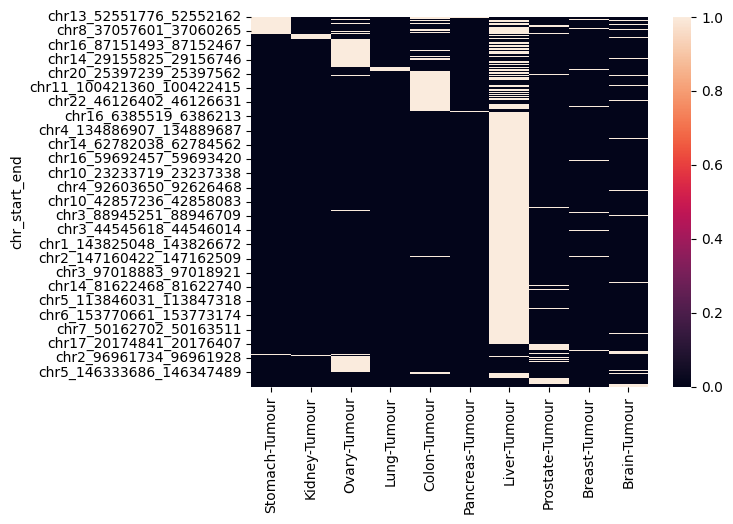

In [40]:
sns.heatmap(binary_dmr_df)

In [41]:
def plot_region(cpg, df, toi, tissue_id_map, id_tissue_map,
                highlight_tissues=[],
               label_as_tissues=False,
               savename=''):
    """
    Plot the methylation ratios for a single CpG region across multiple tissue samples.
    
    Parameters:
        cpg (str): CpG region to plot
        df (DataFrame): DataFrame containing methylation ratios
        toi (str): Tissue of Interest
        tissue_id_map (dict): Dictionary mapping tissues to sample IDs
        id_tissue_map (dict): Dictionary mapping sample IDs to tissues
        highlight_tissues (list): List of tissues to highlight with 'X' marker
    """
    # Handle non-unique index by selecting the first entry
    selected_cpg = df.loc[cpg, :]
    if len(selected_cpg) > 1:
        selected_cpg = selected_cpg.iloc[0, :]
        
    # Generate unique colors for each tissue type
#     unique_tissues = list(tissue_id_map.keys())
#     unique_tissues = np.unique([id_tissue_map[col] for col in df.columns])
    unique_tissues = [t for i, t in enumerate(id_tissue_map[col] for col in df.columns) if t not in (id_tissue_map[col] for col in df.columns[:i])]
    cmap = plt.get_cmap('jet')
    colors = cmap(np.linspace(0, 1.0, len(unique_tissues)))
    tissue_colors = dict(zip(unique_tissues, colors))
    
    # Create the plot
    plt.figure(figsize=(20, 8))
    
    for sample_id, methylation_ratio in selected_cpg.iteritems():
        tissue = id_tissue_map.get(sample_id, 'Unknown')
        color = tissue_colors.get(tissue, 'grey')
        
        # Choose marker based on whether the tissue is in the highlight_tissues list
        marker = '*' if tissue in highlight_tissues else 'o'
        size = 150 if marker == '*' else 100
        linewidth = 1 if marker == '*' else None
        
        plt.scatter(sample_id, methylation_ratio, c=[color], marker=marker, s=size, linewidth=linewidth)
    
    
    
    # Add legends and labels
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=tissue, markersize=10, markerfacecolor=color) for tissue, color in tissue_colors.items()]
    plt.legend(title='Tissues', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=90)
    
    if label_as_tissues:
        
        xticks = np.arange(0, df.shape[1], 1)
        tissue_xticklabels = [id_tissue_map[u] for u in df.columns]
        plt.xticks(ticks=xticks, labels=tissue_xticklabels, rotation=90)
        
#         plt.xticklabels(tissue_xticklabels,fontsize=8)
#         ax.set_xticks(xticks)
#         ax.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)
    
    parts = cpg.split('_')
    formatted_location = f'{parts[0]}:{parts[1]}-{parts[2]}'

    
    plt.xlabel('Sample IDs')
    plt.ylabel('Methylation Ratio')
    plt.title(f'Methylation Ratios for CpG region {formatted_location}')
    plt.grid(True)
    
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    
    if savename:
        plt.savefig(savename)
    plt.show()

    


In [42]:
dmr_shared_count.sort_values(by='Shared_Count',ascending=False).head(n=14)

,DMR,Shared_Count,label
128915,chr8_66960671_66963826,9,Hyper
129120,chr8_70068696_70073108,9,Hyper
128839,chr1_118982389_118995531,9,Hyper
128707,chr20_21098420_21106887,9,Hyper
128785,chr14_56794073_56799814,8,Hyper
128824,chr14_56802650_56818457,8,Hyper
319,chr2_116553028_116553153,8,Hypo
129253,chr20_44809216_44811082,8,Hyper
17745,chr1_159371585_159373744,8,Hypo
129138,chr17_36930797_36946720,8,Hyper


In [43]:

# dmbs.loc['chr17_36930797_36946720',:]

### Pick tissue ordering for region plots

In [44]:
tissue_sample_list = []
_ = [tissue_sample_list.extend(tissue_id_map[tissue]) for tissue in tissue_order]



In [45]:
tissue_sample_order = []

for tissue in healthy_tissue_types:
    tissue_sample_order.extend(tissue_id_map[tissue])
print(len(tissue_sample_order))
    
for tissue in cancer_tissue_types:
    tissue_sample_order.extend(tissue_id_map[tissue])
    

81


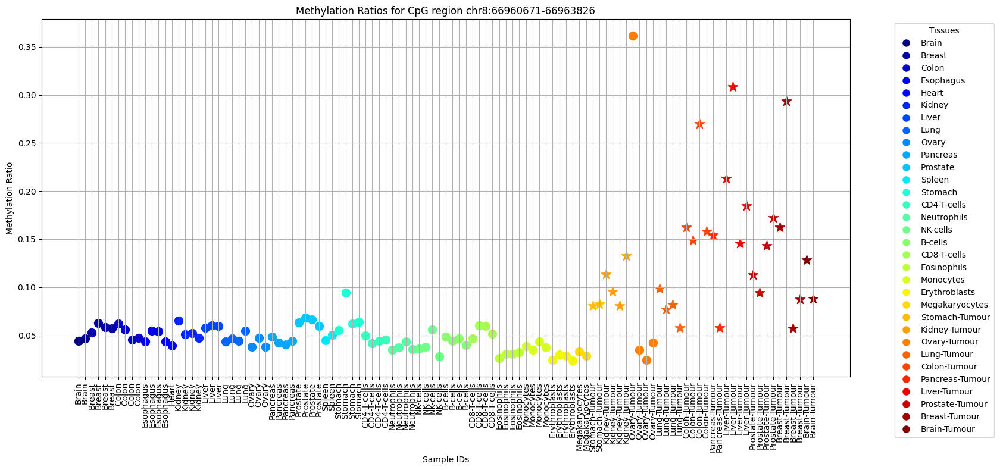

In [46]:
dmr_index = "chr8_66960671_66963826"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_hyper_shared_dmb1.{dmr_index}.scatterplot.png"



df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True,
#             savename=savename,
            )


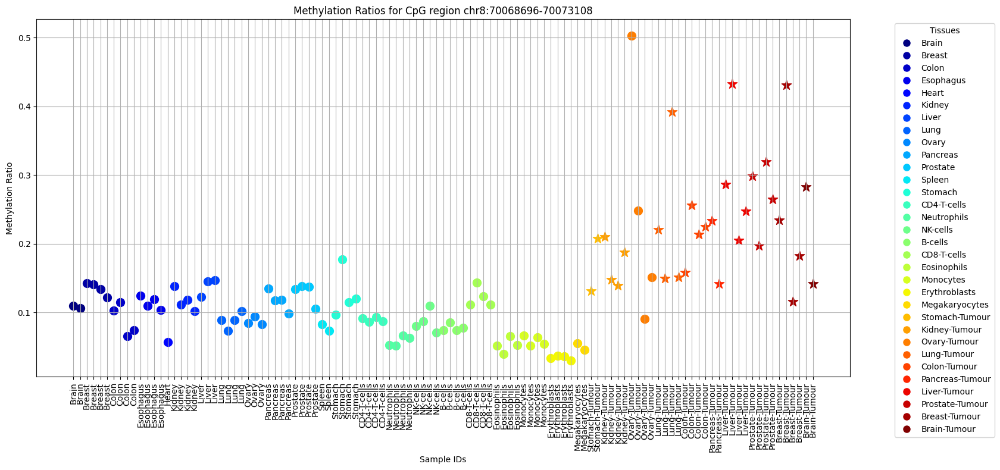

In [47]:
dmr_index = "chr8_70068696_70073108"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_hyper_shared_dmb2.{dmr_index}.scatterplot.png"



df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True,
#            savename=savename
           )



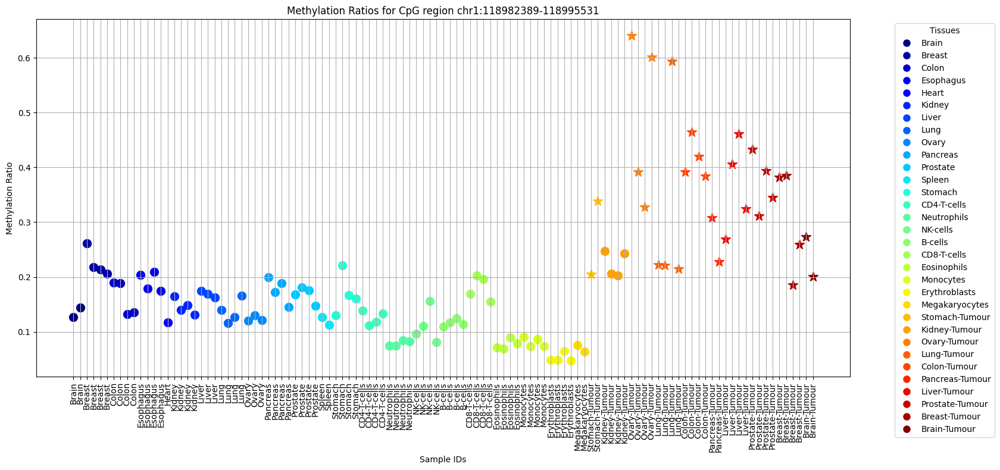

In [48]:
dmr_index = "chr1_118982389_118995531"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_hyper_shared_dmb3.{dmr_index}.scatterplot.png"


df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True,
#            savename=savename,
           )



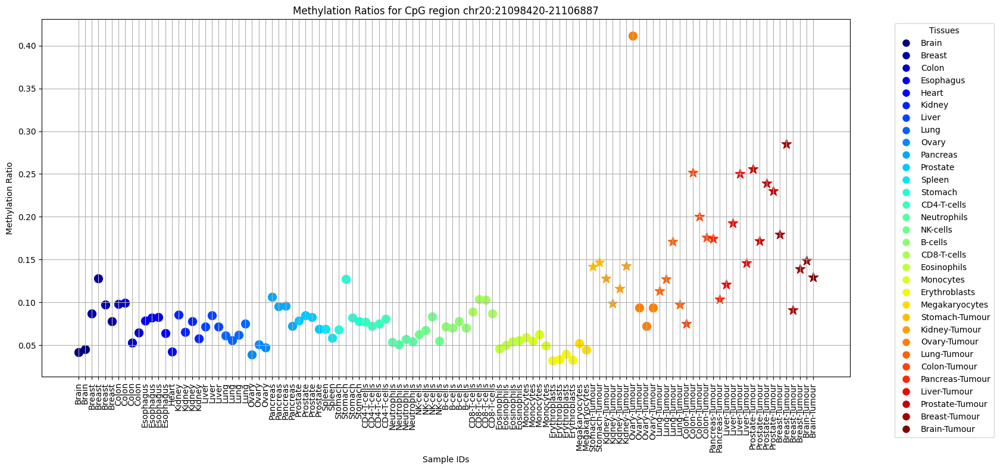

In [49]:
dmr_index = "chr20_21098420_21106887"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"


# fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# savename = fig_savedir + f"mc_hypo_shared_dmb4.{dmr_index}.scatterplot.png"

df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True,
#            savename=savename,
           )



In [ ]:

dmr_index = 'chr2_116553028_116553153'
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_hypo_shared_dmb4.{dmr_index}.scatterplot.png"

df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True,
           savename=savename)



In [ ]:
dmr_index = "chr1_159371585_159373744"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True)




In [ ]:
"chr6_85270792_85270835"
"chr8_141575991_141576619"

# dmr_index = "chr6_85270792_85270835"
dmr_index = "chr8_141575991_141576619"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

df = dmbs[[u for u in tissue_sample_order if u in dmbs.columns]]
highlight_tissues = true_indices
plot_region(dmr_index, 
#             dmbs[[u for u in tissue_sample_list if u in dmbs.columns]],
            df,
            toi,
            tissue_id_map,
            id_tissue_map,
            highlight_tissues=highlight_tissues,
           label_as_tissues=True)




In [ ]:
dmr_index = "chr20_44809216_44811082"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues=highlight_tissues)


In [ ]:

# 'chr14_56802650_56818457' 



dmr_index = "chr17_36930797_36946720"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues=highlight_tissues)


In [ ]:
# 'chr14_56802650_56818457' 


dmr_index = 'chr1_118982389_118995531' 
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues=highlight_tissues)


In [ ]:
# 'chr14_56802650_56818457' 


dmr_index = 'chr20_21098420_21106887' 
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues=highlight_tissues)


In [ ]:
# 'chr14_56802650_56818457' 


dmr_index = 'chr14_56802650_56818457' 
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()
toi="Liver"

highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues=highlight_tissues)


In [ ]:
highlight_tissues

In [ ]:
dmr_index = "chr8_70068696_70073108"
# dmr_index = "chr1_185001490_185001695"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()


highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues)


In [ ]:


# dmr_index = "chr20_44809216_44811177"
# s = binary_dmr_df.loc[dmr_index,:]==1
# true_indices = s[s].index.tolist()


# highlight_tissues = true_indices
# plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues)


In [ ]:
dmr_index = "chr20_21098420_21106887"
s = binary_dmr_df.loc[dmr_index,:]==1
true_indices = s[s].index.tolist()


highlight_tissues = true_indices
plot_region(dmr_index, tissue_samples_mr, toi, tissue_id_map, id_tissue_map, highlight_tissues)


In [ ]:
# dmr_index = "chr20_21098420_21106887"
# target_tissue = "Prostate-Tumour"
# tissue_groups
# plot_dmr_with_highlight2(df, dmr_index, target_tissue, tissue_groups, args=None, hypo=True):


### Visualise DMBs which are shared across multiple tumour types

In [62]:
dmr_shared_count.loc[dmr_shared_count['Shared_Count']>6]['DMR']

136        chr1_241945209_241945279
319        chr2_116553028_116553153
436        chr2_210249559_210249723
443        chr5_176823386_176823438
562          chr6_85270792_85270835
1501       chr2_126621794_126623054
1800         chr8_87241506_87241629
1830        chr16_86187582_86187766
2048         chr8_49060531_49060777
2245       chr2_126551692_126552197
2330       chr1_159303846_159307263
2638      chr10_130643497_130643779
2688       chr8_141575991_141576619
3337       chr1_153188644_153188902
3820         chr2_59172725_59173505
5457           chr2_4003153_4003245
9037       chr7_145045248_145045447
9849       chr8_137927194_137927482
13127     chr10_128390287_128391085
15320       chr16_86664461_86665220
17745      chr1_159371585_159373744
18338      chr7_157469450_157469515
23181         chr16_8504554_8504729
36715         chr10_2766675_2766800
99952        chr7_39854699_39855388
128632          chr19_496402_496462
128707      chr20_21098420_21106887
128723     chr2_240831435_24

In [63]:
# tissue_sample_order = []

# for tissue in healthy_tissue_types:
#     tissue_sample_order.extend(tissue_id_map[tissue])
    
# for tissue in cancer_tissue_types:
#     tissue_sample_order.extend(tissue_id_map[tissue])
    

In [64]:
tissue_sample_order = []

for tissue in healthy_tissue_types:
    tissue_sample_order.extend(tissue_id_map[tissue])
print(len(tissue_sample_order))
    
for tissue in cancer_tissue_types:
    tissue_sample_order.extend(tissue_id_map[tissue])
    

81


In [67]:
df = dmbs

In [68]:
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>1]['DMR']),:]
shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']=="Hypo"),:]

# shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]

# # shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
# plt.figure(figsize=(12, 9))
# sns.heatmap(shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]],
# #             annot=False, 
# # #             mask=mask,
#             cmap='coolwarm',
# #             fmt='g',
# #             linewidths=.5,
# #            norm=LogNorm(),
#            )

In [69]:
cancer_tissue_samples = []
for tissue in cancer_tissue_types:
    cancer_tissue_samples.extend(tissue_id_map[tissue])

In [70]:
# sns.clustermap(shared_dmb_df[[u for u in shared_dmb_df.columns if u in cancer_tissue_samples]])

### Make combined plot of shared DMBs and PCA

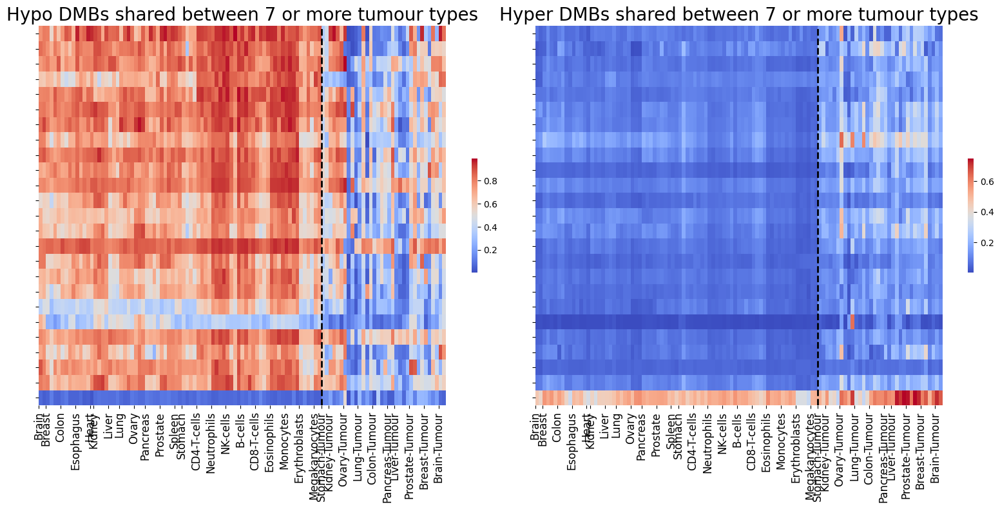

In [81]:

import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


fig,axes = plt.subplots(1,2,figsize=(16, 8))


for j,hyper_or_hypo in enumerate(['Hypo','Hyper']):
    ax = axes[j]

    df = dmbs
    n_shared_tumour_types = 6
#     hyper_or_hypo = "Hyper"
    shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
    shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]
    cbar_shrink=0.3

    shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
    plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
    # shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
    sns.heatmap(plot_df,
    #             annot=False, 
    # #             mask=mask,
                cmap='coolwarm',
    #             fmt='g',
    #             linewidths=.5,
    #            norm=LogNorm(),
                ax=ax,
                xticklabels=1,
                cbar_kws={'shrink':cbar_shrink},
               )
    ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

    xticks = np.arange(0, plot_df.shape[1], 1)
    tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
    
    unique_tissue_names = []
    tick_positions = []
    for k,tissue in enumerate(tissue_xticklabels):
        if tissue in unique_tissue_names:
            pass
        else:
            tick_positions.append(k)
            unique_tissue_names.append(tissue)
    
    
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(unique_tissue_names, rotation=90,fontsize=12)
    # ax2.set_xticks(xticks)
    # ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)


    ax.set_yticklabels([])
    ax.set_ylabel('')


    # Add a vertical dashed line at the specified x-coordinate (index)
    # Line style is dashed ('--'), color is black ('k'), and linewidth is 1
    first_tumor_sample_index = 76.5

    ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=2)



    # fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
    # savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
    # plt.savefig(savename)



#     ax = axes[1,j]
#     hyper_df = shared_dmb_df



#     df = shared_dmb_df
#     # Transpose the DataFrame to have samples as rows
#     df = df[[u for u in df if u in id_tissue_map.keys()]]
#     df_transposed = df.T




#     # Perform PCA
#     pca = PCA(n_components=2)
#     principal_components = pca.fit_transform(df_transposed)

#     # Create a new DataFrame for plotting
#     pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

#     # Define two colors: one for cancer and one for healthy
#     cancer_color = 'darkred'  # Pastel red
#     healthy_color = 'darkgreen'  # Pastel blue

#     # Plotting
#     # plt.figure(figsize=(10, 8))
#     for i, index in enumerate(pca_df.index):
#         color = cancer_color if 'Tumour' in index else healthy_color
#         marker = '*' if 'Tumour' in index else 'o'
#         ax.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
#     #     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

#     cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
#     healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

#     # Add legend to the plot
#     ax.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.15,1))


#     ax.set_xlabel('Principal Component 1')
#     ax.set_ylabel('Principal Component 2')
#     # plt.title('PCA Plot')
#     # ax.set_title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

#     ax.grid(visible=True)
#     # plt.show()


#     fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
#     savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.PCA.png"
#     # plt.savefig(savename)


plt.tight_layout()

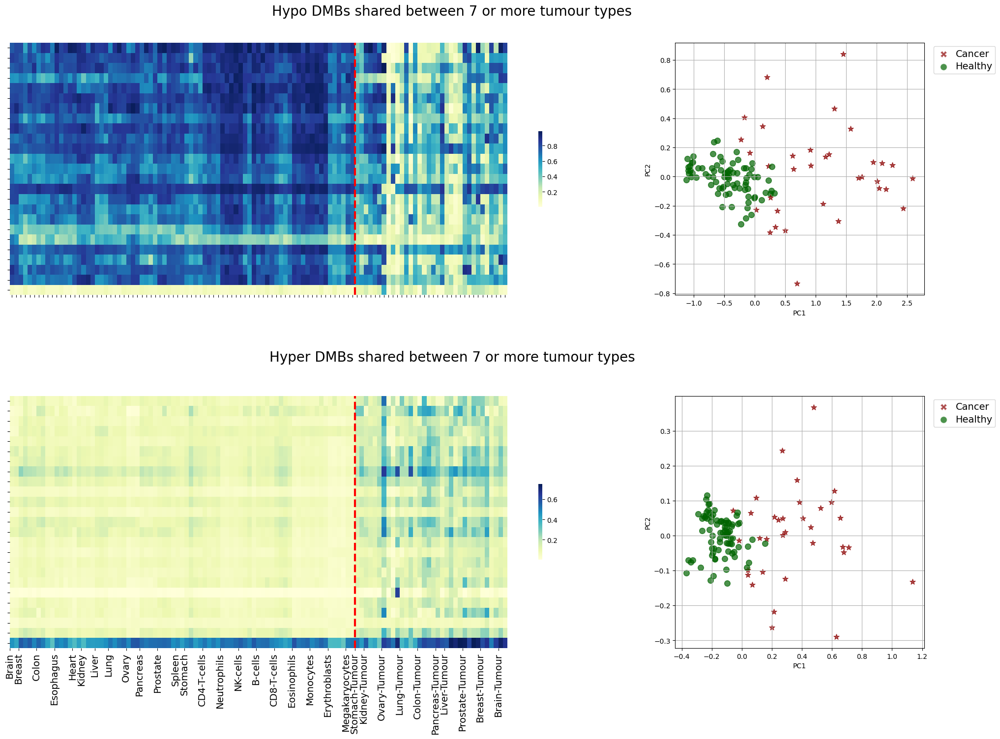

In [114]:

import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


fig,axes = plt.subplots(2,2,figsize=(24, 16),gridspec_kw={'width_ratios': [5, 2]})


plt.subplots_adjust(wspace=0.1, hspace=0.4) 

for j,hyper_or_hypo in enumerate(['Hypo','Hyper']):
    ax = axes[j,0]

    df = dmbs
    n_shared_tumour_types = 6
#     hyper_or_hypo = "Hyper"
    shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
    shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]
    cbar_shrink=0.3

    shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
    plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
    # shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
    sns.heatmap(plot_df,
    #             annot=False, 
    # #             mask=mask,
#                 cmap='coolwarm',
                    cmap='YlGnBu',
    #             fmt='g',
    #             linewidths=.5,
    #            norm=LogNorm(),
                ax=ax,
                xticklabels=1,
                cbar_kws={'shrink':cbar_shrink},
               )
#     ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

    xticks = np.arange(0, plot_df.shape[1], 1)
    tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
    
    unique_tissue_names = []
    tick_positions = []
    for k,tissue in enumerate(tissue_xticklabels):
        if tissue in unique_tissue_names:
            pass
        else:
            
            if tissue=="Kidney":
                tick_positions.append(k+1)
                unique_tissue_names.append(tissue)   
            else:
                tick_positions.append(k)
                unique_tissue_names.append(tissue)
    
    
    if j==1:
        ax.set_xticks(tick_positions)
        ax.set_xticklabels(unique_tissue_names, rotation=90,fontsize=14)
    else:
        ax.set_xticklabels([])
    
    # ax2.set_xticks(xticks)
    # ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)

#     ax.set_yticklabels(ax.get_yticklabels(), fontsize=14) 
    ax.set_yticklabels([])
    ax.set_ylabel('')


    # Add a vertical dashed line at the specified x-coordinate (index)
    # Line style is dashed ('--'), color is black ('k'), and linewidth is 1
    first_tumor_sample_index = 76.5

    ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='r', linewidth=3)



    # fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
    # savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
    # plt.savefig(savename)



    ax = axes[j,1]
    hyper_df = shared_dmb_df



    df = shared_dmb_df
    # Transpose the DataFrame to have samples as rows
    df = df[[u for u in df if u in id_tissue_map.keys()]]
    df_transposed = df.T




    # Perform PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(df_transposed)

    # Create a new DataFrame for plotting
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

    # Define two colors: one for cancer and one for healthy
    cancer_color = 'darkred'  # Pastel red
    healthy_color = 'darkgreen'  # Pastel blue

    # Plotting
    # plt.figure(figsize=(10, 8))
    for i, index in enumerate(pca_df.index):
        color = cancer_color if 'Tumour' in index else healthy_color
        marker = '*' if 'Tumour' in index else 'o'
        ax.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
    #     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

    cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
    healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

    # Add legend to the plot
    legend = ax.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.3,1))
    for text in legend.get_texts():
        text.set_fontsize(14)  # Adjust font size as needed

#     ax.set_xlabel('Principal Component 1')
#     ax.set_ylabel('Principal Component 2')
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    # plt.title('PCA Plot')
    # ax.set_title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

    ax.grid(visible=True)
    # plt.show()



# Titles for top and bottom rows
top_title = f"Hypo DMBs shared between {n_shared_tumour_types+1} or more tumour types"
bottom_title = f"Hyper DMBs shared between {n_shared_tumour_types+1} or more tumour types"

# Add titles using fig.text
fig.text(0.5, 0.92, top_title, ha='center', va='center', fontsize=20)
fig.text(0.5, 0.48, bottom_title, ha='center', va='center', fontsize=20)

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# savename = fig_savedir + f"mc_dmbs.shared_dmbs_heatmap_pca.joint_figure.{n_shared_tumour_types+1}ormore.thesis_clean.png"
savename = fig_savedir + f"mc_dmbs.shared_dmbs_heatmap_pca.joint_figure.{n_shared_tumour_types+1}ormore.no_dmb_labels.thesis_clean.png"
plt.savefig(savename,dpi=300)


# plt.tight_layout()

# plt.tight_layout()

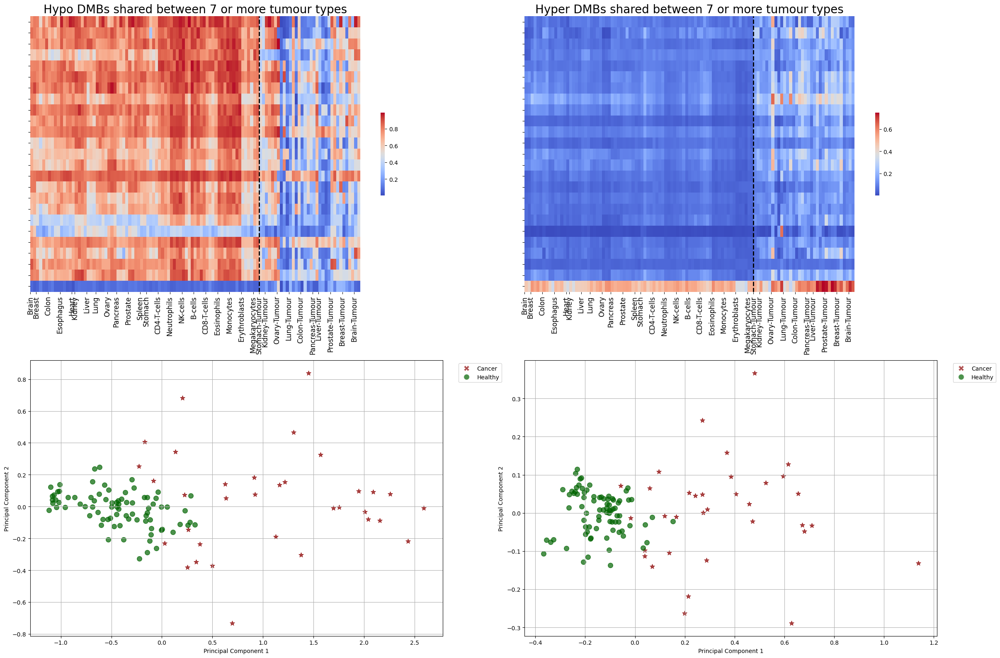

In [76]:

import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


fig,axes = plt.subplots(2,2,figsize=(24, 16))


for j,hyper_or_hypo in enumerate(['Hypo','Hyper']):
    ax = axes[0,j]

    df = dmbs
    n_shared_tumour_types = 6
#     hyper_or_hypo = "Hyper"
    shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
    shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]
    cbar_shrink=0.3

    shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
    plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
    # shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
    sns.heatmap(plot_df,
    #             annot=False, 
    # #             mask=mask,
                cmap='coolwarm',
    #             fmt='g',
    #             linewidths=.5,
    #            norm=LogNorm(),
                ax=ax,
                xticklabels=1,
                cbar_kws={'shrink':cbar_shrink},
               )
    ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

    xticks = np.arange(0, plot_df.shape[1], 1)
    tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
    
    unique_tissue_names = []
    tick_positions = []
    for k,tissue in enumerate(tissue_xticklabels):
        if tissue in unique_tissue_names:
            pass
        else:
            tick_positions.append(k)
            unique_tissue_names.append(tissue)
    
    
    ax.set_xticks(tick_positions)
    ax.set_xticklabels(unique_tissue_names, rotation=90,fontsize=12)
    # ax2.set_xticks(xticks)
    # ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)


    ax.set_yticklabels([])
    ax.set_ylabel('')


    # Add a vertical dashed line at the specified x-coordinate (index)
    # Line style is dashed ('--'), color is black ('k'), and linewidth is 1
    first_tumor_sample_index = 76.5

    ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=2)



    # fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
    # savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
    # plt.savefig(savename)



    ax = axes[1,j]
    hyper_df = shared_dmb_df



    df = shared_dmb_df
    # Transpose the DataFrame to have samples as rows
    df = df[[u for u in df if u in id_tissue_map.keys()]]
    df_transposed = df.T




    # Perform PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(df_transposed)

    # Create a new DataFrame for plotting
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

    # Define two colors: one for cancer and one for healthy
    cancer_color = 'darkred'  # Pastel red
    healthy_color = 'darkgreen'  # Pastel blue

    # Plotting
    # plt.figure(figsize=(10, 8))
    for i, index in enumerate(pca_df.index):
        color = cancer_color if 'Tumour' in index else healthy_color
        marker = '*' if 'Tumour' in index else 'o'
        ax.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
    #     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

    cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
    healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

    # Add legend to the plot
    ax.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.15,1))


    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    # plt.title('PCA Plot')
    # ax.set_title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

    ax.grid(visible=True)
    # plt.show()


    fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
    savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.PCA.png"
    # plt.savefig(savename)


plt.tight_layout()

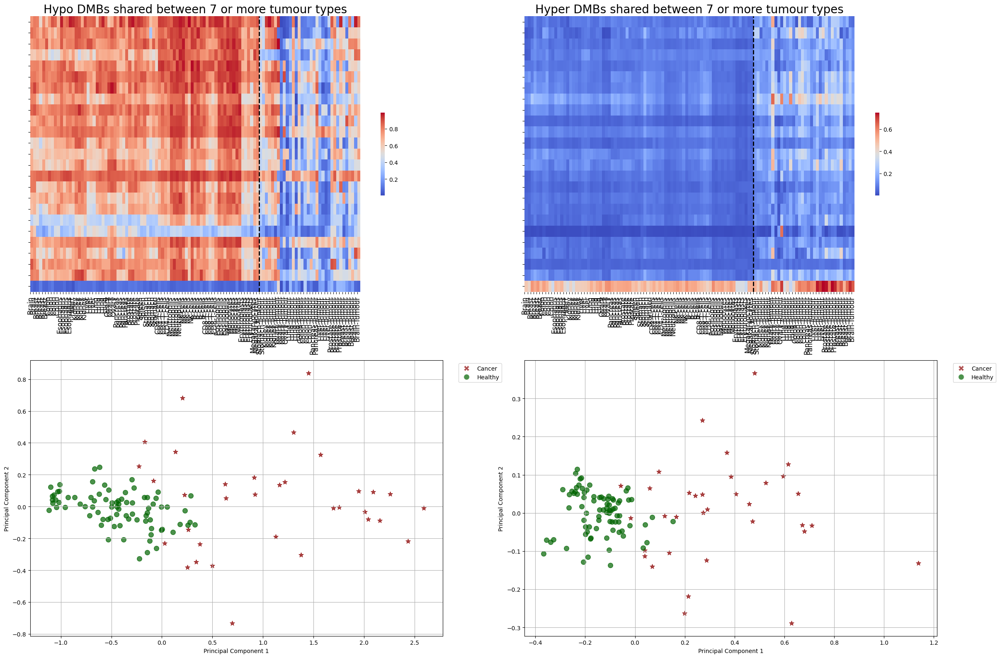

In [70]:

import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


fig,axes = plt.subplots(2,2,figsize=(24, 16))


for j,hyper_or_hypo in enumerate(['Hypo','Hyper']):
    ax = axes[0,j]

    df = dmbs
    n_shared_tumour_types = 6
#     hyper_or_hypo = "Hyper"
    shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
    shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]
    cbar_shrink=0.3

    shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
    plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
    # shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
    sns.heatmap(plot_df,
    #             annot=False, 
    # #             mask=mask,
                cmap='coolwarm',
    #             fmt='g',
    #             linewidths=.5,
    #            norm=LogNorm(),
                ax=ax,
                xticklabels=1,
                cbar_kws={'shrink':cbar_shrink},
               )
    ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

    xticks = np.arange(0, plot_df.shape[1], 1)
    tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
    ax.set_xticks(xticks)
    ax.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=12)
    # ax2.set_xticks(xticks)
    # ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)


    ax.set_yticklabels([])
    ax.set_ylabel('')


    # Add a vertical dashed line at the specified x-coordinate (index)
    # Line style is dashed ('--'), color is black ('k'), and linewidth is 1
    first_tumor_sample_index = 76.5

    ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=2)



    # fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
    # savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
    # plt.savefig(savename)



    ax = axes[1,j]
    hyper_df = shared_dmb_df



    df = shared_dmb_df
    # Transpose the DataFrame to have samples as rows
    df = df[[u for u in df if u in id_tissue_map.keys()]]
    df_transposed = df.T




    # Perform PCA
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(df_transposed)

    # Create a new DataFrame for plotting
    pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

    # Define two colors: one for cancer and one for healthy
    cancer_color = 'darkred'  # Pastel red
    healthy_color = 'darkgreen'  # Pastel blue

    # Plotting
    # plt.figure(figsize=(10, 8))
    for i, index in enumerate(pca_df.index):
        color = cancer_color if 'Tumour' in index else healthy_color
        marker = '*' if 'Tumour' in index else 'o'
        ax.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
    #     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

    cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
    healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

    # Add legend to the plot
    ax.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.15,1))


    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    # plt.title('PCA Plot')
    # ax.set_title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

    ax.grid(visible=True)
    # plt.show()


    fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
    savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.PCA.png"
    # plt.savefig(savename)


plt.tight_layout()

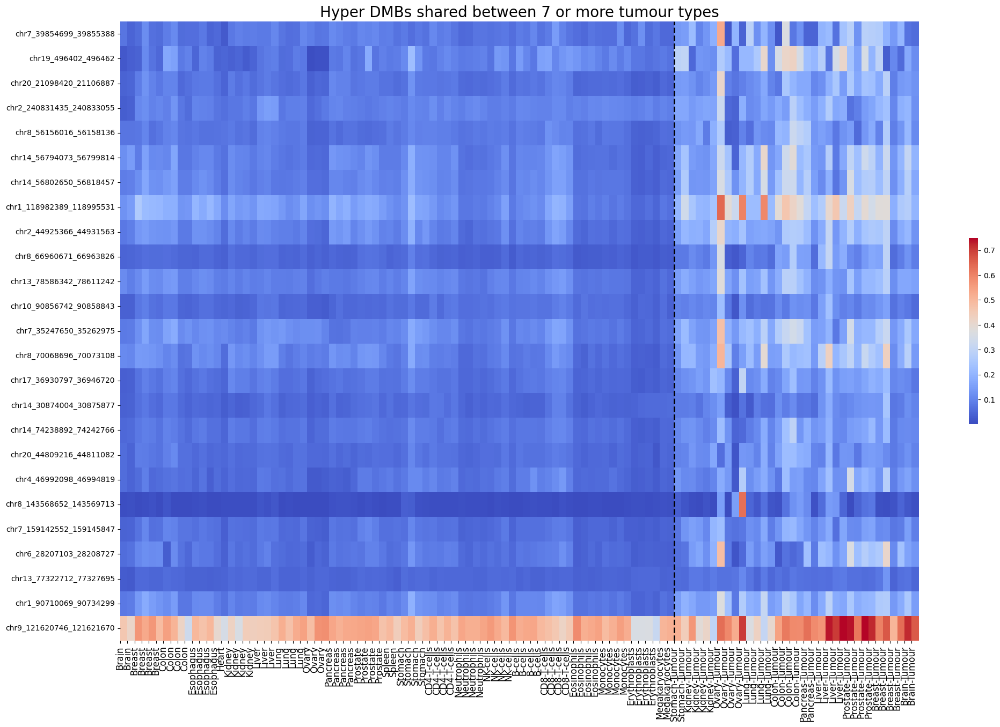

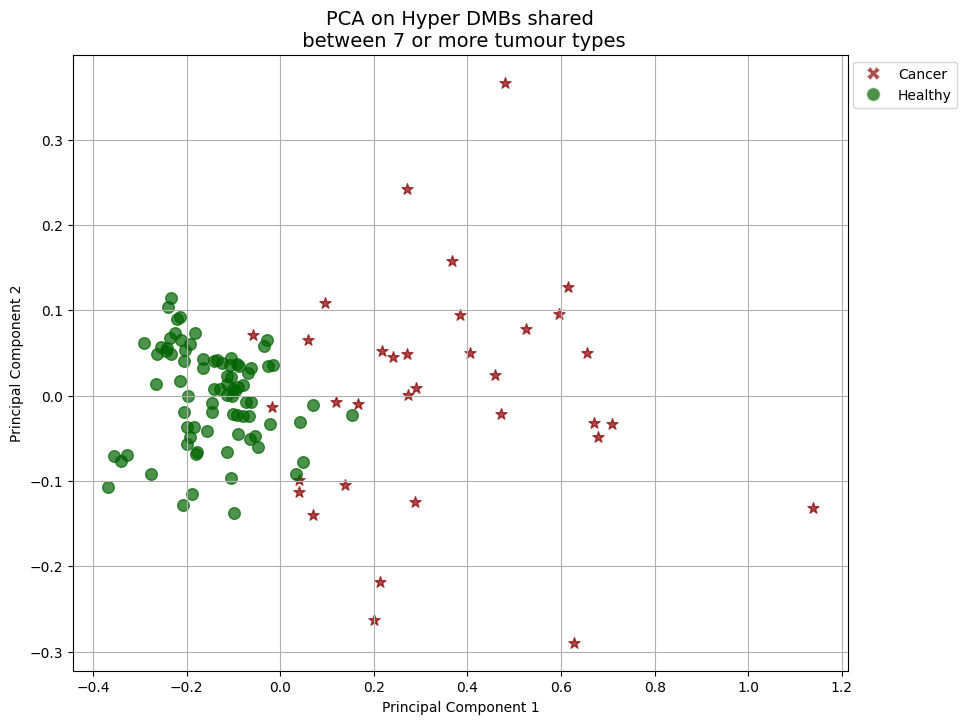

In [63]:

import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt



df = dmbs
n_shared_tumour_types = 6
hyper_or_hypo = "Hyper"
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]
cbar_shrink=0.3

shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
# shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
fig,ax = plt.subplots(figsize=(24, 15))
sns.heatmap(plot_df,
#             annot=False, 
# #             mask=mask,
            cmap='coolwarm',
#             fmt='g',
#             linewidths=.5,
#            norm=LogNorm(),
            ax=ax,
            xticklabels=1,
            cbar_kws={'shrink':cbar_shrink},
           )
ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

xticks = np.arange(0, plot_df.shape[1], 1)
tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
ax.set_xticks(xticks)
ax.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=12)
# ax2.set_xticks(xticks)
# ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)



ax.set_ylabel('')


# Add a vertical dashed line at the specified x-coordinate (index)
# Line style is dashed ('--'), color is black ('k'), and linewidth is 1
first_tumor_sample_index = 76.5

ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=2)



fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
# plt.savefig(savename)

hyper_df = shared_dmb_df



df = shared_dmb_df
# Transpose the DataFrame to have samples as rows
df = df[[u for u in df if u in id_tissue_map.keys()]]
df_transposed = df.T




# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_transposed)

# Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

# Define two colors: one for cancer and one for healthy
cancer_color = 'darkred'  # Pastel red
healthy_color = 'darkgreen'  # Pastel blue

# Plotting
plt.figure(figsize=(10, 8))
for i, index in enumerate(pca_df.index):
    color = cancer_color if 'Tumour' in index else healthy_color
    marker = '*' if 'Tumour' in index else 'o'
    plt.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
#     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

# Add legend to the plot
plt.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.15,1))


plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
# plt.title('PCA Plot')
plt.title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

plt.grid(True)
# plt.show()


fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.PCA.png"
# plt.savefig(savename)



In [71]:
shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]].columns

Index(['C505016_Brain', 'C707004_Brain', 'CD563137_Breast', 'CD564068_Breast',
       'CD563304_Breast', 'CD564368_Breast', 'CD564159_Colon',
       'CD563663_Colon', 'CD563419_Colon', 'CD565189_Colon',
       ...
       'CD564980_Prostate-Tumour', 'CD563882_Prostate-Tumour',
       'CD563761_Prostate-Tumour', 'CD564414_Prostate-Tumour',
       'CD564575_Breast-Tumour', 'CD564076_Breast-Tumour',
       'CD563503_Breast-Tumour', 'CD565056_Breast-Tumour',
       'C707008_Brain-Tumour', 'C707009_Brain-Tumour'],
      dtype='object', length=111)

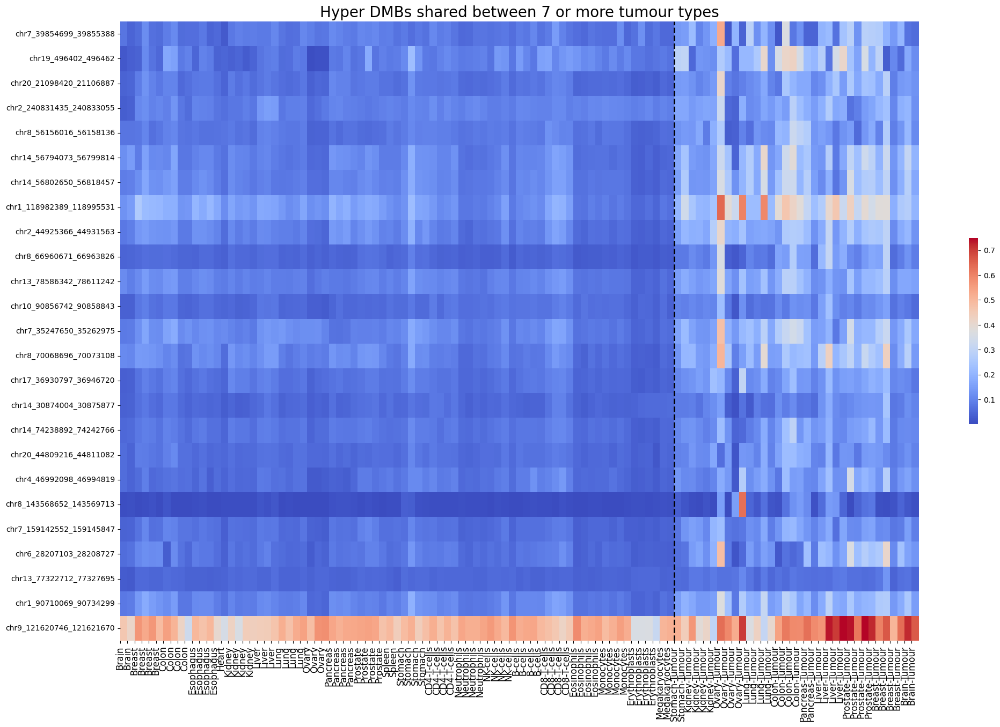

In [50]:
df = dmbs
n_shared_tumour_types = 6
hyper_or_hypo = "Hyper"
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]
cbar_shrink=0.3

shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
# shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
fig,ax = plt.subplots(figsize=(24, 15))
sns.heatmap(plot_df,
#             annot=False, 
# #             mask=mask,
            cmap='coolwarm',
#             fmt='g',
#             linewidths=.5,
#            norm=LogNorm(),
            ax=ax,
            xticklabels=1,
            cbar_kws={'shrink':cbar_shrink},
           )
ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

xticks = np.arange(0, plot_df.shape[1], 1)
tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
ax.set_xticks(xticks)
ax.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=12)
# ax2.set_xticks(xticks)
# ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)



ax.set_ylabel('')


# Add a vertical dashed line at the specified x-coordinate (index)
# Line style is dashed ('--'), color is black ('k'), and linewidth is 1
first_tumor_sample_index = 76.5

ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=2)



fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
# savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
# plt.savefig(savename)

Text(0.5, 1.0, 'PCA Plot')

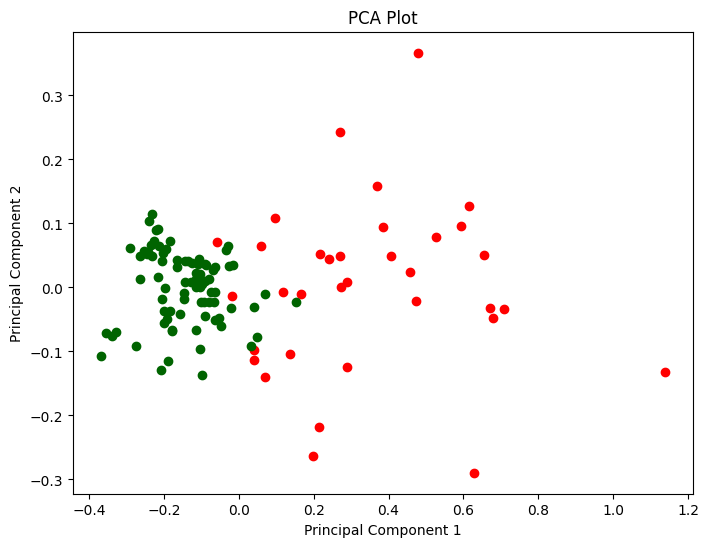

In [54]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load your DataFrame here
# df = pd.read_csv('your_file.csv')

# Sample data for demonstration
# data = {
#     "CD564159_Colon": np.random.rand(10),
#     "CD563663_Colon": np.random.rand(10),
#     # Add more columns as per your data
#     "CD564588_Stomach-Tumour": np.random.rand(10),
#     "CD564659_Stomach-Tumour": np.random.rand(10),
#     # ...
# }
# df = pd.DataFrame(data)

df = shared_dmb_df
# Transpose the DataFrame to have samples as rows
df = df[[u for u in df if u in id_tissue_map.keys()]]
df_transposed = df.T

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_transposed)

# Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

# Determine the color for each sample
colors = ['red' if 'Tumour' in index else 'darkgreen' for index in pca_df.index]

# Plotting
plt.figure(figsize=(8, 6))
for i, color in enumerate(colors):
    plt.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
# plt.show()



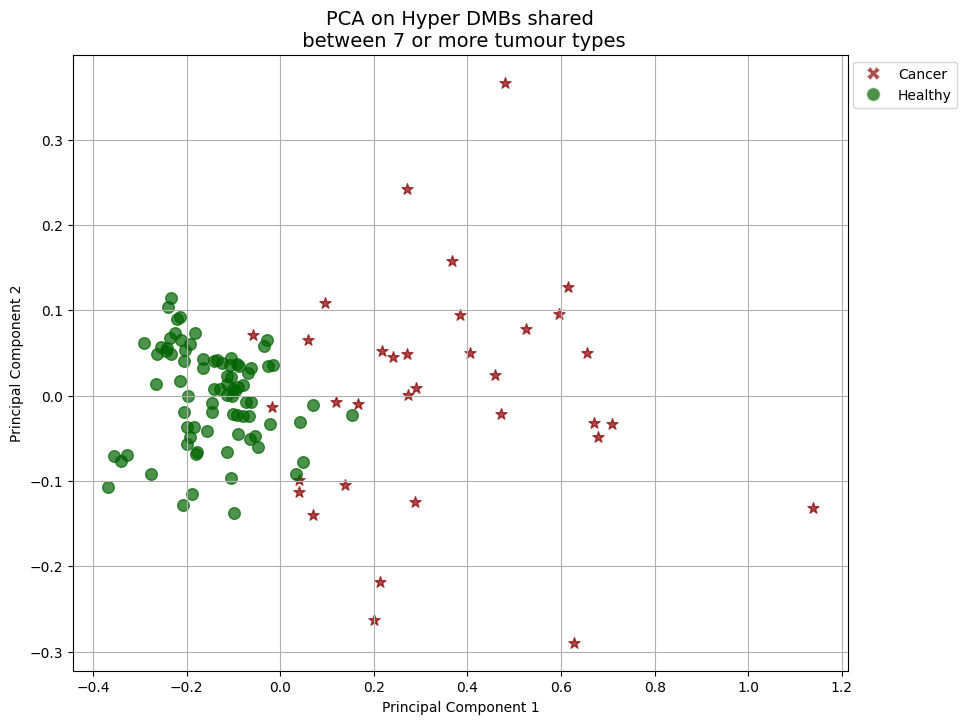

In [55]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt


# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_transposed)

# Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

# Define two colors: one for cancer and one for healthy
cancer_color = 'darkred'  # Pastel red
healthy_color = 'darkgreen'  # Pastel blue

# Plotting
plt.figure(figsize=(10, 8))
for i, index in enumerate(pca_df.index):
    color = cancer_color if 'Tumour' in index else healthy_color
    marker = '*' if 'Tumour' in index else 'o'
    plt.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
#     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

# Add legend to the plot
plt.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.15,1))


plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
# plt.title('PCA Plot')
plt.title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

plt.grid(True)
# plt.show()


fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.PCA.png"
# plt.savefig(savename)


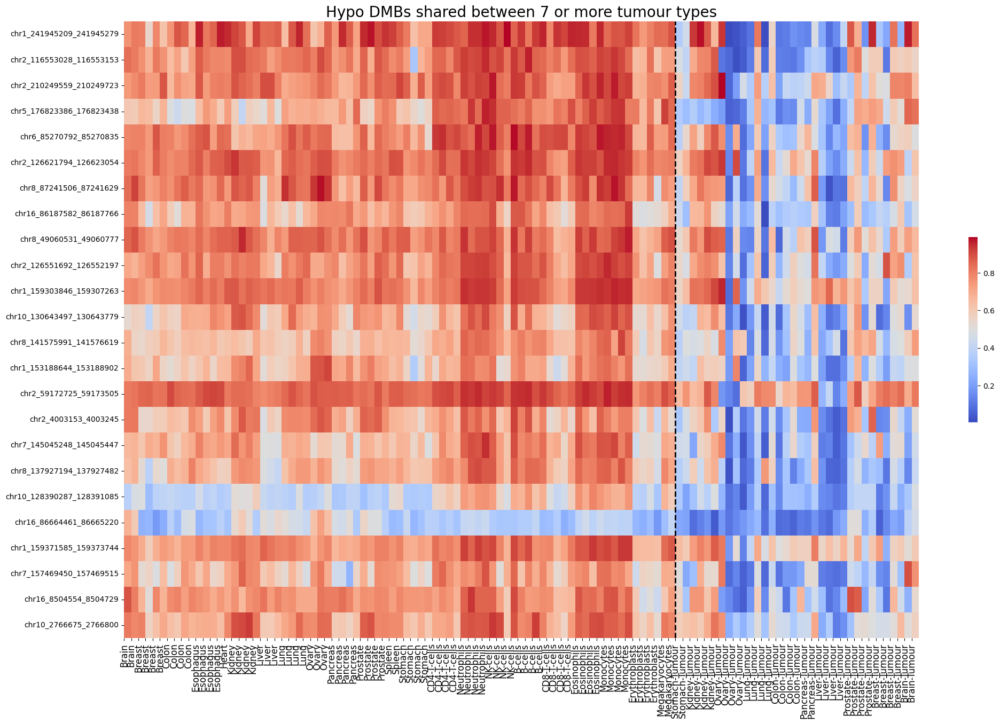

In [56]:
df = dmbs
n_shared_tumour_types = 6
hyper_or_hypo = "Hypo"
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>n_shared_tumour_types]['DMR']),:]
shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']==hyper_or_hypo),:]

shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]
plot_df = shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]]
# shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']) & (df['Hyper_or_Hypo']=="Hyper"),:]
fig,ax = plt.subplots(figsize=(24, 15))
sns.heatmap(plot_df.iloc[0:-1,:],
#             annot=False, 
# #             mask=mask,
            cmap='coolwarm',
#             fmt='g',
#             linewidths=.5,
#            norm=LogNorm(),
            ax=ax,
            xticklabels=1,
            cbar_kws={'shrink':cbar_shrink},
           )
ax.set_title(f"{hyper_or_hypo} DMBs shared between {n_shared_tumour_types+1} or more tumour types",fontsize=20)

xticks = np.arange(0, plot_df.shape[1], 1)
tissue_xticklabels = [id_tissue_map[u] for u in plot_df.columns]
ax.set_xticks(xticks)
ax.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=12)
# ax2.set_xticks(xticks)
# ax2.set_xticklabels(tissue_xticklabels, rotation=90,fontsize=8)



ax.set_ylabel('')


# Add a vertical dashed line at the specified x-coordinate (index)
# Line style is dashed ('--'), color is black ('k'), and linewidth is 1
first_tumor_sample_index = 76.5

ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=2)

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.heatmap.png"
# plt.savefig(savename)




In [58]:
hypo_df = shared_dmb_df

Text(0.5, 1.0, 'PCA Plot')

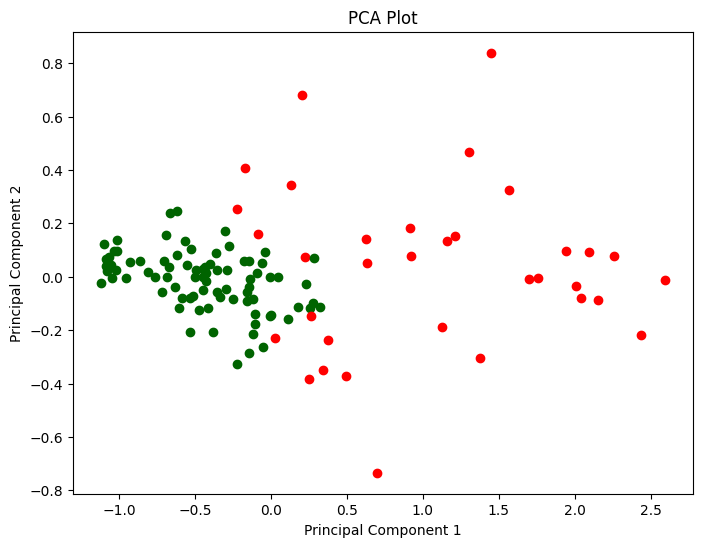

In [59]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Load your DataFrame here
# df = pd.read_csv('your_file.csv')

# Sample data for demonstration
# data = {
#     "CD564159_Colon": np.random.rand(10),
#     "CD563663_Colon": np.random.rand(10),
#     # Add more columns as per your data
#     "CD564588_Stomach-Tumour": np.random.rand(10),
#     "CD564659_Stomach-Tumour": np.random.rand(10),
#     # ...
# }
# df = pd.DataFrame(data)

df = hypo_df
# Transpose the DataFrame to have samples as rows
df = df[[u for u in df if u in id_tissue_map.keys()]]
df_transposed = df.T

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_transposed)

# Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

# Determine the color for each sample
colors = ['red' if 'Tumour' in index else 'darkgreen' for index in pca_df.index]

# Plotting
plt.figure(figsize=(8, 6))
for i, color in enumerate(colors):
    plt.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Plot')
# plt.show()



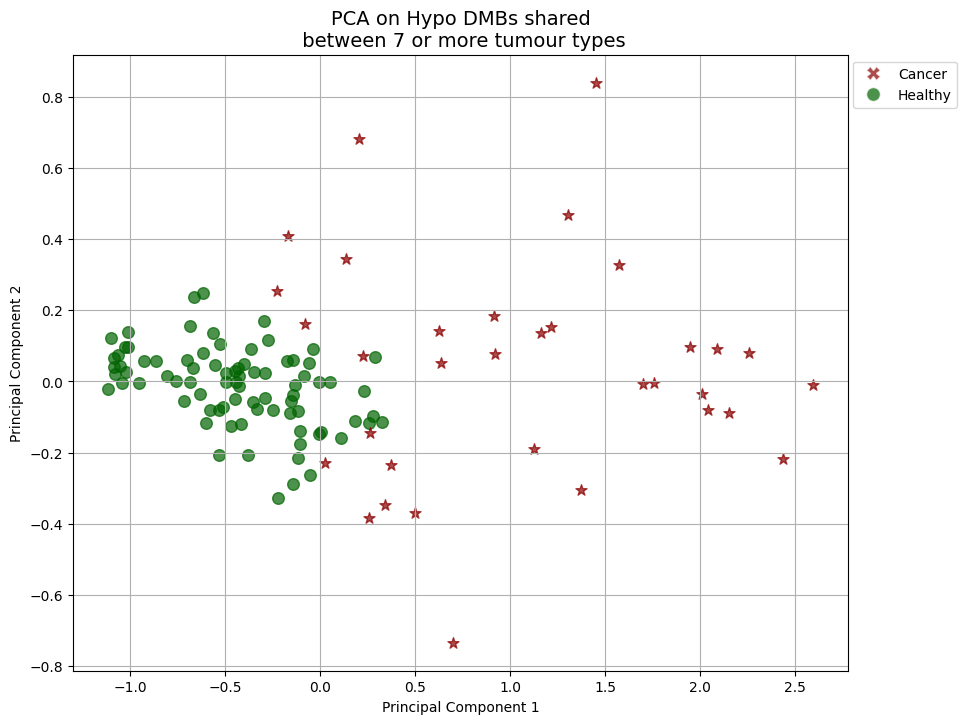

In [60]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# ... Your data loading and preparation ...

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_transposed)

# Create a new DataFrame for plotting
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index=df_transposed.index)

# Define two colors: one for cancer and one for healthy
cancer_color = 'darkred'  # Pastel red
healthy_color = 'darkgreen'  # Pastel blue

# Plotting
plt.figure(figsize=(10, 8))
for i, index in enumerate(pca_df.index):
    color = cancer_color if 'Tumour' in index else healthy_color
    marker = '*' if 'Tumour' in index else 'o'
    plt.scatter(pca_df.iloc[i, 0], pca_df.iloc[i, 1], color=color, alpha=0.7, marker=marker,s=70)
#     plt.text(pca_df.iloc[i, 0], pca_df.iloc[i, 1], index, fontsize=9)

cancer_patch = plt.Line2D([0], [0], marker='X', color='w', label='Cancer', markersize=10, markerfacecolor=cancer_color, alpha=0.7)
healthy_patch = plt.Line2D([0], [0], marker='o', color='w', label='Healthy', markersize=10, markerfacecolor=healthy_color, alpha=0.7)

# Add legend to the plot
plt.legend(handles=[cancer_patch, healthy_patch],bbox_to_anchor=(1.15,1))


plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
# plt.title('PCA Plot')
plt.title(f"PCA on {hyper_or_hypo} DMBs shared\n between {n_shared_tumour_types+1} or more tumour types",fontsize=14)

plt.grid(True)

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/taps_dmrs/"
savename = fig_savedir + f"mc_dmbs.{hyper_or_hypo}.{n_shared_tumour_types+1}ormore.PCA.png"
# plt.savefig(savename)

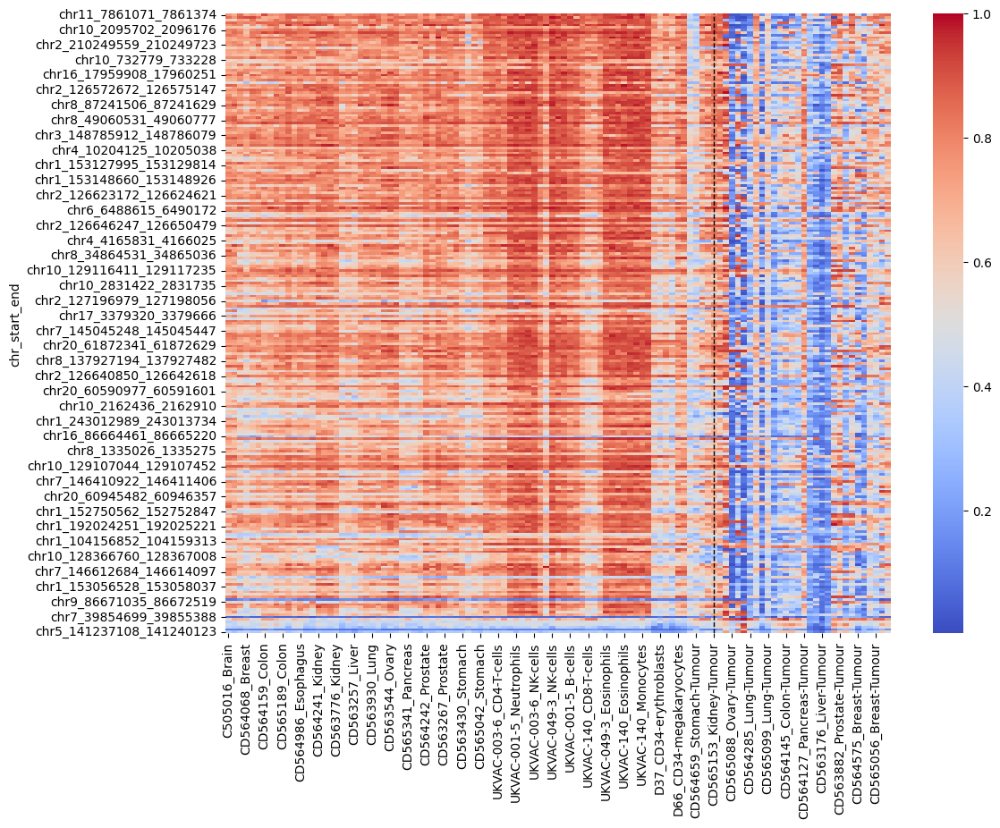

In [78]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df and dmr_shared_count are already defined
# Assuming tissue_sample_order is a list of sample names in the order you want them displayed

# Filter the DataFrame based on conditions
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR']),:]
shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']=="Hypo"),:]

# Remove duplicates based on index
shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]

# Create the heatmap
plt.figure(figsize=(12, 9))
ax = sns.heatmap(shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]],
                 cmap='coolwarm')

# Find the index where the first tumor sample starts in the ordered list
# Replace 'first_tumor_sample' with the name of the first tumor sample in your list
first_tumor_sample_index = 81

# Add a vertical dashed line at the specified x-coordinate (index)
# Line style is dashed ('--'), color is black ('k'), and linewidth is 1
ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=1)

plt.show()


In [79]:
df

,CD564159_Colon,CD563663_Colon,CD563419_Colon,CD565189_Colon,CD564588_Stomach-Tumour,CD564659_Stomach-Tumour,CD564242_Prostate,CD563610_Prostate,CD563685_Prostate,CD563267_Prostate,...,tg_mean,bg_mean,delta_means,tg_quant,bg_quant,delta_quants,ttest,significant_dmrs,Hyper_or_Hypo,selected_tissue
chr_start_end,,,,,,,,,,,,,,,,,,,,,
chr13_52551776_52552162,0.890687,0.847438,0.839813,0.931375,0.327625,0.123063,0.863250,0.806875,0.922000,0.894500,...,0.225344,0.913206,0.687862,0.276484,0.813756,5.372719e-01,3.739175e-32,True,Hypo,Stomach-Tumour
chr12_132203632_132203760,0.855600,0.799800,0.828500,0.842100,0.196900,0.176800,0.863200,0.716300,0.879300,0.870400,...,0.186850,0.852348,0.665498,0.191875,0.641460,4.495850e-01,1.103110e-13,True,Hypo,Stomach-Tumour
chr18_46560416_46560565,0.755375,0.893375,0.803500,0.861375,0.269500,0.207750,0.888500,0.789125,0.924000,0.832625,...,0.238625,0.870497,0.631872,0.254063,0.694825,4.407625e-01,6.991323e-17,True,Hypo,Stomach-Tumour
chr15_53540208_53540811,0.788571,0.897429,0.904000,0.920357,0.333500,0.276571,0.882929,0.921929,0.916500,0.945714,...,0.305036,0.897164,0.592128,0.319268,0.732450,4.131821e-01,4.398550e-21,True,Hypo,Stomach-Tumour
chr1_185001490_185001666,0.883667,0.787333,0.725333,0.910500,0.315833,0.321167,0.930667,0.862000,0.874333,0.912833,...,0.318500,0.889019,0.570519,0.319833,0.732833,4.130000e-01,6.628891e-20,True,Hypo,Stomach-Tumour
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr12_113793059_113793278,0.750000,0.765000,0.755500,0.750750,0.639000,0.572250,0.841000,0.816750,0.832500,0.807250,...,0.909375,0.771789,0.137586,0.896312,0.896300,1.250000e-05,6.009087e-02,False,Hyper,Brain-Tumour
chr5_74417358_74418376,0.640800,0.573600,0.646600,0.752400,0.868400,0.404600,0.743600,0.654000,0.784200,0.754200,...,0.912600,0.775727,0.136873,0.907200,0.907200,2.220446e-16,4.878897e-02,False,Hyper,Brain-Tumour
chr6_164156917_164157655,0.628250,0.646000,0.681750,0.765250,0.488000,0.434750,0.815750,0.674250,0.805000,0.732250,...,0.903000,0.709685,0.193315,0.892500,0.892500,1.110223e-16,2.859909e-02,False,Hyper,Brain-Tumour


In [80]:
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>0]['DMR']),:]


In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df and dmr_shared_count are already defined
# Assuming tissue_sample_order is a list of sample names in the order you want them displayed

# Filter the DataFrame based on conditions
shared_dmb_df = df.loc[(dmr_shared_count.loc[dmr_shared_count['Shared_Count']>0]['DMR']),:]
shared_dmb_df = shared_dmb_df.loc[(shared_dmb_df['Hyper_or_Hypo']=="Hyper"),:]

# Remove duplicates based on index
shared_dmb_df = shared_dmb_df[~shared_dmb_df.index.duplicated(keep='first')]

# Create the heatmap
plt.figure(figsize=(12, 9))
ax = sns.heatmap(shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]],
                 cmap='coolwarm')

# Find the index where the first tumor sample starts in the ordered list
# Replace 'first_tumor_sample' with the name of the first tumor sample in your list
first_tumor_sample_index = 81

# Add a vertical dashed line at the specified x-coordinate (index)
# Line style is dashed ('--'), color is black ('k'), and linewidth is 1
ax.axvline(x=first_tumor_sample_index + 0.5, linestyle='--', color='k', linewidth=1)

plt.show()


ValueError: zero-size array to reduction operation fmin which has no identity

<Figure size 1200x900 with 0 Axes>

<Axes: ylabel='chr_start_end'>

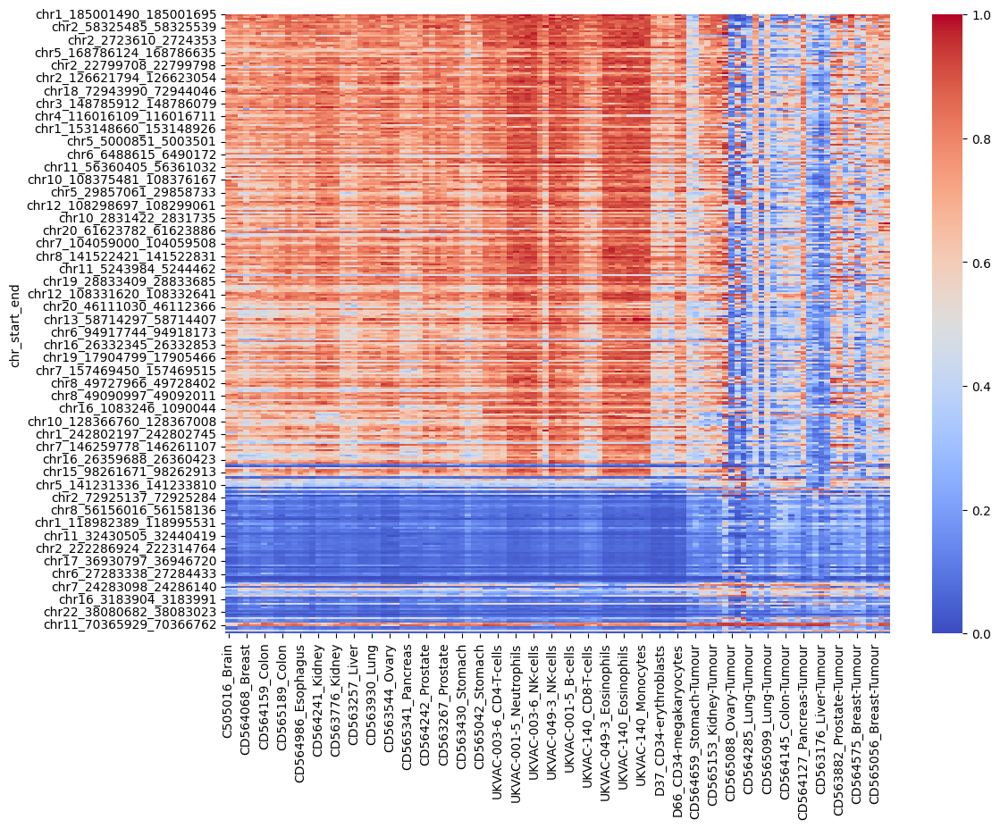

In [66]:

shared_dmb_df = df.loc[dmr_shared_count.loc[dmr_shared_count['Shared_Count']>5]['DMR'],:]
plt.figure(figsize=(12, 9))
sns.heatmap(shared_dmb_df[[u for u in tissue_sample_order if u in shared_dmb_df.columns]],
#             annot=False, 
# #             mask=mask,
            cmap='coolwarm',
#             fmt='g',
#             linewidths=.5,
#            norm=LogNorm(),
           )

In [ ]:
df.loc[]

In [56]:
def plot_region(cpg, df, toi, tissue_id_map, id_tissue_map, highlight_tissues=[]):
    """
    Plot the methylation ratios for a single CpG region across multiple tissue samples.
    
    Parameters:
        cpg (str): CpG region to plot
        df (DataFrame): DataFrame containing methylation ratios
        toi (str): Tissue of Interest
        tissue_id_map (dict): Dictionary mapping tissues to sample IDs
        id_tissue_map (dict): Dictionary mapping sample IDs to tissues
        highlight_tissues (list): List of tissues to highlight with 'X' marker
    """
    # Handle non-unique index by selecting the first entry
    selected_cpg = df.loc[cpg, :]
    if len(selected_cpg) > 1:
        selected_cpg = selected_cpg.iloc[0, :]
        
    # Generate unique colors for each tissue type
    unique_tissues = list(tissue_id_map.keys())
    cmap = plt.get_cmap('jet')
    colors = cmap(np.linspace(0, 1.0, len(unique_tissues)))
    tissue_colors = dict(zip(unique_tissues, colors))
    
    # Create the plot
    plt.figure(figsize=(20, 8))
    
    for sample_id, methylation_ratio in selected_cpg.iteritems():
        tissue = id_tissue_map.get(sample_id, 'Unknown')
        color = tissue_colors.get(tissue, 'grey')
        
        # Choose marker based on whether the tissue is in the highlight_tissues list
        marker = '*' if tissue in highlight_tissues else 'o'
        size = 150 if marker == '*' else 100
        linewidth = 1 if marker == '*' else None
        
        plt.scatter(sample_id, methylation_ratio, c=[color], marker=marker, s=size, linewidth=linewidth)
    
    # Add legends and labels
    handles = [plt.Line2D([0], [0], marker='o', color='w', label=tissue, markersize=10, markerfacecolor=color) for tissue, color in tissue_colors.items()]
    plt.legend(title='Tissues', handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=90)
    plt.xlabel('Sample IDs')
    plt.ylabel('Methylation Ratio')
    plt.title(f'Methylation Ratios for CpG region {cpg}')
    plt.grid(True)
    
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()


### Cluster by all DMBs contained in at least one cancer type